# Analyses of extremes

In [1]:
import xarray as xr
import numpy as np
import pandas as pd
import sys
import os
import seaborn as sns
import intake
from scipy.stats import linregress
from scipy import stats
from dask import delayed
from IPython.display import display, HTML
import imageio
#from joblib import Parallel, delayed
import matplotlib.dates as mdates
import intake
from DV8_extremes import *
#DV8_functions(1) packages
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.animation import FFMpegWriter
from matplotlib import animation, rc
from IPython.display import HTML
#my functions:


import matplotlib.colors as mcolors

from tempfile import TemporaryDirectory
from getpass import getuser
from pathlib import Path
import dask
from dask.distributed import Client, LocalCluster
import bokeh
import subprocess
import re

import warnings
#warnings.filterwarnings('ignore')
scratch_dir = Path('/scratch') / getuser()[0] / getuser()

/home/b/b382616/.conda/envs/super_trooper/lib/python3.14/site-packages/pyproj/network.py:59: UserWarning: pyproj unable to set PROJ database path.
  _set_context_ca_bundle_path(ca_bundle_path)


In [2]:


dask.config.config.get('distributed').get('dashboard').update({'link':'{JUPYTERHUB_SERVICE_PREFIX}/proxy/{port}/status'})
cluster = LocalCluster(n_workers=32,threads_per_worker=1)
client = Client(cluster)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /user/b382616/levante-spawner-advanced//proxy/8787/status,
Dashboard: /user/b382616/levante-spawner-advanced//proxy/8787/status,Workers: 32
Total threads: 32,Total memory: 250.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:38467,Workers: 0
Dashboard: /user/b382616/levante-spawner-advanced//proxy/8787/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:33623,Total threads: 1
Dashboard: /user/b382616/levante-spawner-advanced//proxy/46589/status,Memory: 7.81 GiB
Nanny: tcp://127.0.0.1:34027,


2025-12-16 14:20:01,298 - distributed.scheduler - WARNING - Removing worker 'tcp://127.0.0.1:39697' caused the cluster to lose already computed task(s), which will be recomputed elsewhere: {('from-value-c1bd1ab6f25a27feb1d3fab8bf14aee3-4a68a73f97914c13ba5a7df3017743dc-cca880c80e674ec58332aec2230c67b7',), ('from-value-19b5c4fcbbd5e006ff6a85ea11565b10-a2998aa5e284417689f7ec60c3f48949-cca880c80e674ec58332aec2230c67b7', 0, 0, 0), ('from-value-9e4f70239170350e7bfff6a1cf596ca6-4a68a73f97914c13ba5a7df3017743dc-9665aa88a4af49eda8e2bd0ae9f4d208',), ('from-value-f008d7563aa18031af73b46f3a7aaaf2-da664f6f44b24a1c833e78275e249ccb-cca880c80e674ec58332aec2230c67b7',), ('add-ed290dc3bb58f217ebf916e540a2fe77-a2998aa5e284417689f7ec60c3f48949-cca880c80e674ec58332aec2230c67b7',), ('from-value-90ff17a54348a48616cbe432880340b3-f3ac2db6e0d942099d5ef285323c622f-9665aa88a4af49eda8e2bd0ae9f4d208',), ('finalize-hlgfinalizecompute-getitem-from-value-from-value-34faa3075395f857721329ebf730bd52-f1afce12983e451fbcec

# LOAD DATA
### Only take latitudes between 50°S and 70°N, to retain only ice-free oceans. To make sure no sea ice appears in these latitudes we apply SSTA=SSTA.where(sst>-1.7) for all anomalies. Gridcells with sea ice are defined in OSTIA,ICON and IFS-FESOM as an SST value of ~-1.75, by applying the where condition we make sure to only take ice free times and grid-cells without throwing out entire areas, but only the times and places where sea ice appears.
### Convert ICON and IFS-FESOM longitudes from 0->360 to -180->180

In [3]:

def lon_180w_180e(ds_sice: xr.DataArray):
    ds_sice = (
        ds_sice
        .assign_coords(lon=lambda x: (x.lon - 180) % 360 - 180)
        .sortby('lon'))

    return ds_sice

In [4]:
#SST

# OSTIA
filename='/scratch/b/b382615/mhws/ostia.zarr' 
sst = xr.open_zarr(str(filename), chunks={'time':150, 'lat':-1, 'lon':-1}).sst
sst=sst.sel(lat=slice(-50, 70))
sst=sst-273.15

# ICON HISTORICAL
cat = intake.open_catalog("https://raw.githubusercontent.com/eerie-project/intake_catalogues/main/eerie.yaml")
dat = cat['dkrz.disk.model-output.icon-esm-er.hist-1950.v20240618.ocean.gr025']
sst_ic = dat['2d_daily_mean'](chunks={}).to_dask().to.isel(depth=0).drop_vars('depth').chunk({'time':150, 'lat':-1, 'lon':-1})
sst_ic=sst_ic.sel(lat=slice(-50, 70))


# IFS FESOM
cat = intake.open_catalog("https://raw.githubusercontent.com/eerie-project/intake_catalogues/main/eerie.yaml")
dat = cat['dkrz.disk.model-output.ifs-fesom2-sr.hist-1950.v20240304.ocean.gr025']#.icon-esm-er.hist-1950.v20240618.ocean.gr025']
sst_f = dat['2D_daily_avg_1950-2014'].to_dask().avg_tos.isel(depth=0).drop_vars('depth').chunk({'time':150, 'lat':-1, 'lon':-1})
sst_f=sst_f.sel(lat=slice(-50, 70))



In [6]:
# HADGEM LL
sst_LL = xr.open_dataset(
    '/home/b/b382616/scratch/mhws/hadgem/input_data/LL/toscon_nemo_u-da156_1d_19700101-20150101_grid-025.nc',
    chunks={'time': 150, 'lat': -1, 'lon': -1}  # Chunk by year, full spatial dimensions
)
sst_LL=sst_LL['toscon'].sel(lat=slice(-50, 70))


# HADGEM MM
sst_MM = xr.open_dataset(
    '/home/b/b382616/scratch/mhws/hadgem/input_data/MM/toscon_nemo_u-dc396_1d_19700101-20150101_grid-025.nc',
    chunks={'time': 150, 'lat': -1, 'lon': -1}  # Chunk by year, full spatial dimensions
)
sst_MM=sst_MM['toscon'].sel(lat=slice(-50, 70))


# HADGEM HH
sst_HH = xr.open_dataset(
    '/home/b/b382616/scratch/mhws/hadgem/input_data/HH/toscon_nemo_u-di356_1d_19700101-20150101_grid-025.nc',
    chunks={'time': 150, 'lat': -1, 'lon': -1}  # Chunk by year, full spatial dimensions
)
sst_HH=sst_HH['toscon'].sel(lat=slice(-50, 70))

            


/home/b/b382616/.conda/envs/super_trooper/lib/python3.14/site-packages/xarray/conventions.py:204: SerializationWarning: variable 'toscon' has multiple fill values {np.float32(1e+20), np.float64(1e+20)} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
/home/b/b382616/.conda/envs/super_trooper/lib/python3.14/site-packages/xarray/conventions.py:204: SerializationWarning: variable 'toscon' has multiple fill values {np.float32(1e+20), np.float64(1e+20)} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
/home/b/b382616/.conda/envs/super_trooper/lib/python3.14/site-packages/xarray/conventions.py:204: SerializationWarning: variable 'toscon' has multiple fill values {np.float32(1e+20), np.float64(1e+20)} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)


## SHIFTING BASELINE

In [5]:
##OSTIA extremes shifting baseline

#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'OSTIA_pre_1982_2014_shift_hob_maxanom5.zarr'

#chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
#ds = xr.open_zarr(str(file_name), chunks=chunks)
#ds = ds.sel(lat=slice(-50, 70))
#o_ex_s=ds['extreme_events']
#sst=sst.sel(time=slice((o_ex_s.time[0].values),str(o_ex_s.time[-1].values)))





##ICON HIST extremes shifting baseline

#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'ICONhist_pre_1982_2014_shift_hob_maxanom5_oct25.zarr'
#chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
#i_ds = xr.open_zarr(str(file_name), chunks=chunks)
#i_ds=lon_180w_180e(i_ds)
#i_ds = i_ds.sel(lat=slice(-50, 70))
#i_ex_s=i_ds['extreme_events']
#sst_ic=sst_ic.sel(time=slice(str(i_ex_f.time[0].values),str(i_ex_f.time[-1].values)))
#i_ex_float = i_ex_s.astype(float)  # Convert to 0.0 and 1.0
#i_ex_s = i_ex_float > 0.5  # Convert back to boolean if needed




##IFS-FESOM extremes shifting baseline

#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'IFSFESOMhist_pre_1982_2014_shift_hob_maxanom5_oct25.zarr'
#chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
#f_ds = xr.open_zarr(str(file_name), chunks=chunks)
#f_ds=lon_180w_180e(f_ds)
#f_ds = f_ds.sel(lat=slice(-50, 70))
#f_ex_s=f_ds['extreme_events']
#fssta=f_ds['dat_anomaly']
#f_ex_float = f_ex_s.astype(float) 
#f_ex_s = f_ex_float > 0.5  # Convert back to boolean if needed



## FIXED BASELINE

In [9]:
# SST ANOMALIES
# FIXED BASELINES


# FIXED BASELINES

# OSTIA ANOMALIES
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'OSTIA_pre_1982_2014_FixedDetrend_hob_oct25.zarr'
chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
ds = xr.open_zarr(str(file_name), chunks=chunks)
ds = ds.sel(lat=slice(-50, 70))
ossta=ds['dat_anomaly']
sst=sst.sel(time=slice((ossta.time[0].values),str(ossta.time[-1].values))) #making sure SST time matches SSTA time before masking the sea ice
ossta=ossta.where(sst>-1.7) #remove from anomalies places and times where there is sea ice

file_name = scratch_dir / "mhws" / "DV8"/ "OSTIA_track_1982_2014_FixedDetrend_mask70_onlyarea.zarr"
chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
ds = xr.open_zarr(str(file_name), chunks=chunks)
oblobs = ds.sel(lat=slice(-50, 70))



# ICON HIST ANOMALIES
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'ICONhist_pre_1982_2014_FixedDetrend_hob_nov25.zarr'
chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
i_ds = xr.open_zarr(str(file_name), chunks=chunks)
i_ds=lon_180w_180e(i_ds)
sst_ic=lon_180w_180e(sst_ic)
i_ds = i_ds.sel(lat=slice(-50, 70))
issta=i_ds['dat_anomaly']
sst_ic=sst_ic.sel(time=slice(str(issta.time[0].values),str(issta.time[-1].values)))
# Now apply the sea ice mask
issta = issta.where(sst_ic > -1.7)



# IFS-FESOM ANOMALIES
#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'IfsFesom_pre_1982_2014_FixedDetrend_hob_nov25.zarr'
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'IfsFesom_pre_1982_2014_FixedDetrend_hob_dec25.zarr'
chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
f_ds = xr.open_zarr(str(file_name), chunks=chunks)
f_ds=lon_180w_180e(f_ds)
sst_f=lon_180w_180e(sst_f)
f_ds = f_ds.sel(lat=slice(-50, 70))
fssta=f_ds['dat_anomaly']
sst_f=sst_f.sel(time=slice((fssta.time[0].values),str(fssta.time[-1].values)))
# Now apply the sea ice mask
fssta = fssta.where(sst_f > -1.7)


# HADGEM LL ANOMALIES
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'hadgem'/'marEx'/'LL'/'HadGEM3-LL_marEx_extremes_detrend_fixed_baseline_1982-2014.zarr'
chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
LL_ds = xr.open_zarr(str(file_name), chunks=chunks)
LL_ds=lon_180w_180e(LL_ds)
sst_LL=lon_180w_180e(sst_LL)
LL_ds = LL_ds.sel(lat=slice(-50, 70))
LLssta=LL_ds['dat_anomaly']
sst_LL=sst_LL.sel(time=slice((LLssta.time[0].values),str(LLssta.time[-1].values)))
# Now apply the sea ice mask
LLssta = LLssta.where(sst_LL > -1.7)

# HADGEM MM ANOMALIES
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'hadgem'/'marEx'/'MM'/'HadGEM3-MM_marEx_extremes_detrend_fixed_baseline_1982-2014.zarr'
chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
MM_ds = xr.open_zarr(str(file_name), chunks=chunks)
MM_ds=lon_180w_180e(MM_ds)
sst_MM=lon_180w_180e(sst_MM)
MM_ds = LL_ds.sel(lat=slice(-50, 70))
MMssta=MM_ds['dat_anomaly']
sst_MM=sst_MM.sel(time=slice((MMssta.time[0].values),str(MMssta.time[-1].values)))
# Now apply the sea ice mask
MMssta = MMssta.where(sst_MM > -1.7)


# HADGEM HH ANOMALIES
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'hadgem'/'marEx'/'HH'/'HadGEM3-HH_marEx_extremes_detrend_fixed_baseline_1982-2014.zarr'
chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
HH_ds = xr.open_zarr(str(file_name), chunks=chunks)
HH_ds=lon_180w_180e(HH_ds)
sst_HH=lon_180w_180e(sst_HH)
HH_ds = HH_ds.sel(lat=slice(-50, 70))
HHssta=HH_ds['dat_anomaly']
sst_HH=sst_HH.sel(time=slice((HHssta.time[0].values),str(HHssta.time[-1].values)))
# Now apply the sea ice mask
HHssta = HHssta.where(sst_HH> -1.7)


/tmp/ipykernel_3490170/3322074494.py:54: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 150. This could degrade performance. Instead, consider rechunking after loading.
  LL_ds = xr.open_zarr(str(file_name), chunks=chunks)
/tmp/ipykernel_3490170/3322074494.py:66: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 150. This could degrade performance. Instead, consider rechunking after loading.
  MM_ds = xr.open_zarr(str(file_name), chunks=chunks)
/tmp/ipykernel_3490170/3322074494.py:79: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 150. This could degrade performance. Instead, consider rechunking after loading.
  HH_ds = xr.open_zarr(str(file_name), chunks=chunks)


In [7]:
# EXTREMES
#FIXED BASELINES



# OSTIA EXTREMES
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'OSTIA_pre_1982_2014_FixedDetrend_hob_oct25.zarr'
chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
ds = xr.open_zarr(str(file_name), chunks=chunks)
ds = ds.sel(lat=slice(-50, 70))
o_ex=ds['extreme_events']
sst=sst.sel(time=slice((o_ex.time[0].values),str(o_ex.time[-1].values)))



# ICON HIST EXTREMES
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'ICONhist_pre_1982_2014_FixedDetrend_hob_nov25.zarr'
chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
i_ds = xr.open_zarr(str(file_name), chunks=chunks)
i_ds=lon_180w_180e(i_ds)
i_ds = i_ds.sel(lat=slice(-50, 70))
i_ex=i_ds['extreme_events']
sst_ic=sst_ic.sel(time=slice(str(i_ex.time[0].values),str(i_ex.time[-1].values)))

# For extreme events (boolean)
i_ex_float = i_ex.astype(float)  # Convert to 0.0 and 1.0
#i_ex_interp = i_ex_float.interp(lat=o_ex.lat, lon=o_ex.lon)
i_ex = i_ex_float > 0.5  # Convert back to boolean if needed





# IFS-FESOM EXTREMES
#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'IfsFesom_pre_1982_2014_FixedDetrend_hob_nov25.zarr'
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'IfsFesom_pre_1982_2014_FixedDetrend_hob_dec25.zarr'
chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
f_ds = xr.open_zarr(str(file_name), chunks=chunks)
f_ds=lon_180w_180e(f_ds)
f_ds = f_ds.sel(lat=slice(-50, 70))
f_ex=f_ds['extreme_events']
fssta=f_ds['dat_anomaly']
#sst_f=sst_f.sel(time=slice((fssta.time[0].values),str(fssta.time[-1].values)))
# For extreme events (boolean)
f_ex_float = f_ex.astype(float)  # Convert to 0.0 and 1.0
#f_ex_interp = f_ex_float.interp(lat=o_ex.lat, lon=o_ex.lon)
f_ex = f_ex_float > 0.5  # Convert back to boolean if needed



# HADGEM LL EXTREMES
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'hadgem'/'marEx'/'LL'/'HadGEM3-LL_marEx_extremes_detrend_fixed_baseline_1982-2014.zarr'
chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
LL_ds = xr.open_zarr(str(file_name), chunks=chunks)
LL_ds=lon_180w_180e(LL_ds)
sst_LL=lon_180w_180e(sst_LL)
LL_ds = LL_ds.sel(lat=slice(-50, 70))
LL_ex=LL_ds['extreme_events']
LLssta=LL_ds['dat_anomaly']
LL_ex_float = LL_ex.astype(float) 
LL_ex = LL_ex_float > 0.5 

# HADGEM MM EXTREMES
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'hadgem'/'marEx'/'MM'/'HadGEM3-MM_marEx_extremes_detrend_fixed_baseline_1982-2014.zarr'
chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
MM_ds = xr.open_zarr(str(file_name), chunks=chunks)
MM_ds=lon_180w_180e(MM_ds)
sst_MM=lon_180w_180e(sst_MM)
MM_ds = MM_ds.sel(lat=slice(-50, 70))
MM_ex=MM_ds['extreme_events']
MMssta=MM_ds['dat_anomaly']
MM_ex_float = MM_ex.astype(float) 
MM_ex = MM_ex_float > 0.5 


# HADGEM HH EXTREMES
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'hadgem'/'marEx'/'HH'/'HadGEM3-HH_marEx_extremes_detrend_fixed_baseline_1982-2014.zarr'
chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
HH_ds = xr.open_zarr(str(file_name), chunks=chunks)
HH_ds=lon_180w_180e(HH_ds)
sst_HH=lon_180w_180e(sst_HH)
HH_ds = HH_ds.sel(lat=slice(-50, 70))
HH_ex=HH_ds['extreme_events']
HHssta=HH_ds['dat_anomaly']
HH_ex_float = HH_ex.astype(float) 
HH_ex = HH_ex_float > 0.5 


/tmp/ipykernel_1934583/1203503263.py:54: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 150. This could degrade performance. Instead, consider rechunking after loading.
  LL_ds = xr.open_zarr(str(file_name), chunks=chunks)
/tmp/ipykernel_1934583/1203503263.py:66: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 150. This could degrade performance. Instead, consider rechunking after loading.
  MM_ds = xr.open_zarr(str(file_name), chunks=chunks)
/tmp/ipykernel_1934583/1203503263.py:79: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 150. This could degrade performance. Instead, consider rechunking after loading.
  HH_ds = xr.open_zarr(str(file_name), chunks=chunks)


# Regional masks
Create regional masks based on SST variance relevance. You have to download the oceanic regions from the shapefile at

Flanders Marine Institute (2021). Global Oceans and Seas, version 1. Available online at https://www.marineregions.org/. https://doi.org/10.14284/542.


Put this file in the same place as your shapefile_path. This file is then heavily modified to  adapt it to the wanted regions.

The 'create_oceanic_regions_mask' function needs a one-time slice of global sst to work.

You have to provide an example_sst for each model (if they have different grids) for the oceanic regions masks to be created: Any single time slice of lat and lon will work.

if you don't specify it in the funbction call here,i.e.:

masks = create_oceanic_regions_mask(lats, lons,example_sst=something, method='shapefile')

then it's going to look for it in the same path where I saved my shapefile.

This is what I did:

In [ ]:
# CREATE EXAMPLE SST SLICES FOR MASK CREATION

##Save it to wherever the function create_shapefile_oceanic_regions_mask points to


# ICON HIST EXAMPLE SST
#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'ICONhist_pre_1982_2014_FixedDetrend_hob_nov25.zarr'
#chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
#i_ds = xr.open_zarr(str(file_name), chunks=chunks)
#i_ds=lon_180w_180e(i_ds)
#issta=i_ds['dat_anomaly']
#issta.isel(time=0).to_netcdf('/home/b/b382616/scratch/mhws/DV8/example_sst_ICON.nc')





## IFS-FESOM EXAMPLE SST
#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'IfsFesom_pre_1982_2014_FixedDetrend_hob_nov25.zarr'
#chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
#f_ds = xr.open_zarr(str(file_name), chunks=chunks)
#f_ds=lon_180w_180e(f_ds)
#fssta=f_ds['dat_anomaly']
#fssta.isel(time=0).to_netcdf('/home/b/b382616/scratch/mhws/DV8/example_sst_IFSFESOM.nc')



##for OSTIA EXAMPLE SST
#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'OSTIA_pre_1982_2014_FixedDetrend_hob_oct25.zarr'
#chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
#o_ds = xr.open_zarr(str(file_name), chunks=chunks)
#ossta=o_ds['dat_anomaly']
#ossta.isel(time=0).to_netcdf('/home/b/b382616/scratch/mhws/DV8/example_sst_OSTIA.nc')


# For HadGEM3-LL
#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'hadgem'/'marEx'/'LL'/'HadGEM3-LL_marEx_extremes_detrend_fixed_baseline_1982-2014.zarr'
#chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
#LL_ds = xr.open_zarr(str(file_name), chunks=chunks)
#LLssta=LL_ds['dat_anomaly']
#LLssta.isel(time=0).to_netcdf('/home/b/b382616/scratch/mhws/DV8/example_sst_HadGEM3_LL.nc')

# For HadGEM3-MM
#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'hadgem'/'marEx'/'MM'/'HadGEM3-MM_marEx_extremes_detrend_fixed_baseline_1982-2014.zarr'
#chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
#MM_ds = xr.open_zarr(str(file_name), chunks=chunks)
#MMssta=MM_ds['dat_anomaly']
#MMssta.isel(time=0).to_netcdf('/home/b/b382616/scratch/mhws/DV8/example_sst_HadGEM3_MM.nc')

# For HadGEM3-HH
#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'hadgem'/'marEx'/'HH'/'HadGEM3-HH_marEx_extremes_detrend_fixed_baseline_1982-2014.zarr'
#chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
#HH_ds = xr.open_zarr(str(file_name), chunks=chunks)
#HHssta=HH_ds['dat_anomaly']
#HHssta.isel(time=0).to_netcdf('/home/b/b382616/scratch/mhws/DV8/example_sst_HadGEM3_HH.nc')




In [10]:
#OSTIA
#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'DV8' / 'example_sst_OSTIA.nc'
#chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
#ds_exmp = xr.open_dataset(str(file_name), chunks=chunks)
#ds_exmp=ds_exmp.sel(lat=slice(-50, 70))

#ICON

#issta.isel(time=0).to_netcdf('/home/b/b382616/scratch/mhws/DV8/example_sst_icon.nc')
#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' /'DV8' /  'example_sst_ICON.nc'
#chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
#ds_exmp_ic = xr.open_dataset(str(file_name), chunks=chunks)
#ds_exmp_ic=ds_exmp_ic.sel(lat=slice(-50, 70))


# IFS FESOM

#fssta.isel(time=0).to_netcdf('/home/b/b382616/scratch/mhws/DV8/example_sst_ifsfesom.nc')
#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' /'DV8' /  'example_sst_IFSFESOM.nc'
#chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
#ds_exmp_f = xr.open_dataset(str(file_name), chunks=chunks)
#ds_exmp_f=ds_exmp_f.sel(lat=slice(-50, 70))





### For hadgems it was more complicated....


Since hadgems was saved with version 3 of zarr, and this notebook was initially designed for version 2 (env name 'super'), when I cretated an environment ('super_trooper') with version 3 of zarr, the mask-making fucntions didn't work anymore.
so what I did was:

- on super_trooper: save example_sst files for the three hadgems models (as seen above among the others)
- on super, and in a different notebook: create the masks for hadgems with:


    Define paths
shapefile_path = '/home/b/b382616/scratch/mhws/DV8/goas_v01.shp'
mask_save_dir = Path('/home/b/b382616/scratch/mhws/DV8/extremes_model_masks')

      List of HadGEM models and their example SST files
hadgem_models = {
    'HadGEM3-LL': '/home/b/b382616/scratch/mhws/DV8/example_sst_HadGEM3_LL.nc',
    'HadGEM3-MM': '/home/b/b382616/scratch/mhws/DV8/example_sst_HadGEM3_MM.nc',
    'HadGEM3-HH': '/home/b/b382616/scratch/mhws/DV8/example_sst_HadGEM3_HH.nc'
}

for model_name, example_file in hadgem_models.items():
    print(f"Creating masks for {model_name}...")
    
    # Load the example SST
    ds = xr.open_dataset(example_file)
    
    # Extract the data array (assuming variable is named 'sst')
    if 'sst' in ds:
        data_array = ds['sst']
    else:
        # If not named 'sst', take the first data variable
        var_name = list(ds.data_vars)[0]
        data_array = ds[var_name]
    
    # Create masks
    masks = create_model_specific_shapefile_mask(
        data_array, 
        model_name=model_name, 
        shapefile_path=shapefile_path, 
        mask_save_dir=mask_save_dir
    )
    
    print(f"  Created {len(masks)} masks for {model_name}.")
    print(f"  Masks saved to: {mask_save_dir}")

- and then Here on super_trooper I load them all directly with:



mask_save_dir = Path('/scratch/b/b382616/mhws/DV8/extremes_model_masks')

      All model names
all_models = ['OSTIA', 'ICON', 'IFS-FESOM', 'HadGEM3-LL', 'HadGEM3-MM', 'HadGEM3-HH']

masks_dict = {}

for model in all_models:
    # Find the mask file for this model
    mask_files = list(mask_save_dir.glob(f'*{model}*.zarr'))
    
    if mask_files:
        mask_file = mask_files[0]
        print(f"Loading {model} mask from {mask_file.name}")
        
        mask_ds = xr.open_zarr(str(mask_file))
        
        # For HadGEM models, select latitude range
        if model.startswith('HadGEM3-'):
            mask_ds = mask_ds.sel(lat=slice(-50, 70))
            print(f"  Selected lat range -50 to 70")
        
        masks_dict[model] = mask_ds
        print(f"  ✓ Loaded {len(mask_ds.data_vars)} regions")
    else:
        print(f"Warning: No mask file found for {model}")

print(f"\nSuccessfully loaded masks for {len(masks_dict)} models")

### Create masks from saved example SST

In [27]:
# 1. Define your models dictionary with extreme events data
models_dict = {
    'OSTIA': o_ex,      # Your OSTIA extreme events data
    'ICON': i_ex,       # Your ICON extreme events data  
    'IFS-FESOM': f_ex,   # Your IFS-FESOM extreme events data
    'HadGEM3-LL': LL_ex,
    'HadGEM3-MM': MM_ex,
    'HadGEM3-HH': HH_ex
}

# 2. Create model-specific masks
masks_dict = create_model_specific_masks(models_dict)


# It will automatically search for:
# - /scratch/b/b382616/mhws/DV8/example_sst_OSTIA.nc
# - /scratch/b/b382616/mhws/DV8/example_sst_ICON.nc
# - /scratch/b/b382616/mhws/DV8/example_sst_IFS-FESOM.nc (and variations)


Creating model-specific masks...
Creating masks for OSTIA...
Loading existing masks for model grid (480,) x (1440,)...
  OSTIA grid: (480,) x (1440,)
  OSTIA regions: ['Atlantic_Equatorial', 'Eastern_Equatorial_Pacific', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pacific_SubTropics', 'Pacific_Equatorial', 'South_Atlantic_SubTropics', 'South_Pacific_SubTropics', 'Southern_Ocean', 'Western_Equatorial_Pacific']
Creating masks for ICON...
Loading existing masks for model grid (481,) x (1440,)...
  ICON grid: (481,) x (1440,)
  ICON regions: ['Atlantic_Equatorial', 'Eastern_Equatorial_Pacific', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pacific_SubTropics', 'Pacific_Equatorial', 'South_Atlantic_SubTropics', 

sh: getfattr: command not found
sh: getfattr: command not found
sh: getfattr: command not found


CRSError: Invalid projection: EPSG:4326: (Internal Proj Error: proj_create: no database context specified)

In [1]:
# SIMPLEST SOLUTION: Load all masks directly


mask_save_dir = Path('/scratch/b/b382616/mhws/DV8/extremes_model_masks')

# All model names
all_models = ['OSTIA', 'ICON', 'IFS-FESOM', 'HadGEM3-LL', 'HadGEM3-MM', 'HadGEM3-HH']

masks_dict = {}

for model in all_models:
    # Find the mask file for this model
    mask_files = list(mask_save_dir.glob(f'*{model}*.zarr'))
    
    if mask_files:
        mask_file = mask_files[0]
        print(f"Loading {model} mask from {mask_file.name}")
        
        mask_ds = xr.open_zarr(str(mask_file))
        
        # For HadGEM models, select latitude range
        if model.startswith('HadGEM3-'):
            mask_ds = mask_ds.sel(lat=slice(-50, 70))
            print(f"  Selected lat range -50 to 70")
        
        masks_dict[model] = mask_ds
        print(f"  ✓ Loaded {len(mask_ds.data_vars)} regions")
    else:
        print(f"Warning: No mask file found for {model}")

print(f"\nSuccessfully loaded masks for {len(masks_dict)} models")

Loading OSTIA mask from extremes_OSTIA_480x1440_8350716742437587350_region_masks.zarr
  ✓ Loaded 15 regions
Loading ICON mask from extremes_ICON_481x1440_-2130404455801615551_region_masks.zarr
  ✓ Loaded 15 regions
Loading IFS-FESOM mask from extremes_IFS-FESOM_481x1440_-2130404455801615551_region_masks.zarr
  ✓ Loaded 15 regions
Loading HadGEM3-LL mask from extremes_HadGEM3-LL_721x1440_-4232089158561518125_region_masks.zarr
  Selected lat range -50 to 70
  ✓ Loaded 15 regions
Loading HadGEM3-MM mask from extremes_HadGEM3-MM_721x1440_-4232089158561518125_region_masks.zarr
  Selected lat range -50 to 70
  ✓ Loaded 15 regions
Loading HadGEM3-HH mask from extremes_HadGEM3-HH_721x1440_-4232089158561518125_region_masks.zarr
  Selected lat range -50 to 70
  ✓ Loaded 15 regions

Successfully loaded masks for 6 models


### Or explicitly Providing Example SSTs

In [12]:
# Define example SSTs for each model

#models_sst_examples = {
#    'OSTIA': ds_exmp,      # Your OSTIA example SST
#    'ICON': ds_exmp_ic,    # Your ICON example SST
#    'IFS-FESOM': ds_exmp_f # Your IFS-FESOM example SST
#}


# Use them in mask creation

#masks_dict = create_model_specific_masks(
#    models_dict, 
#    models_example_sst=models_sst_examples
#)

### Plot masks

Creating model-specific masks...
Creating masks for OSTIA...
Loading existing masks for model grid (480,) x (1440,)...
  OSTIA grid: (480,) x (1440,)
  OSTIA regions: ['Atlantic_Equatorial', 'Eastern_Equatorial_Pacific', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pacific_SubTropics', 'Pacific_Equatorial', 'South_Atlantic_SubTropics', 'South_Pacific_SubTropics', 'Southern_Ocean', 'Western_Equatorial_Pacific']
Creating masks for ICON...
Loading existing masks for model grid (481,) x (1440,)...
  ICON grid: (481,) x (1440,)
  ICON regions: ['Atlantic_Equatorial', 'Eastern_Equatorial_Pacific', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pacific_SubTropics', 'Pacific_Equatorial', 'South_Atlantic_SubTropics', 

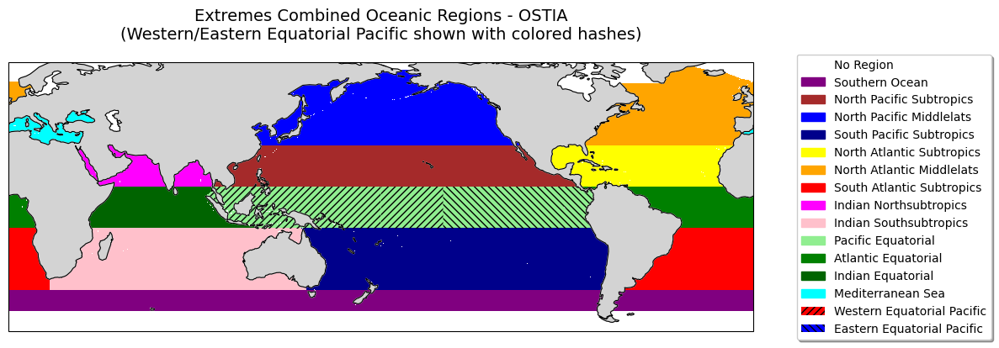

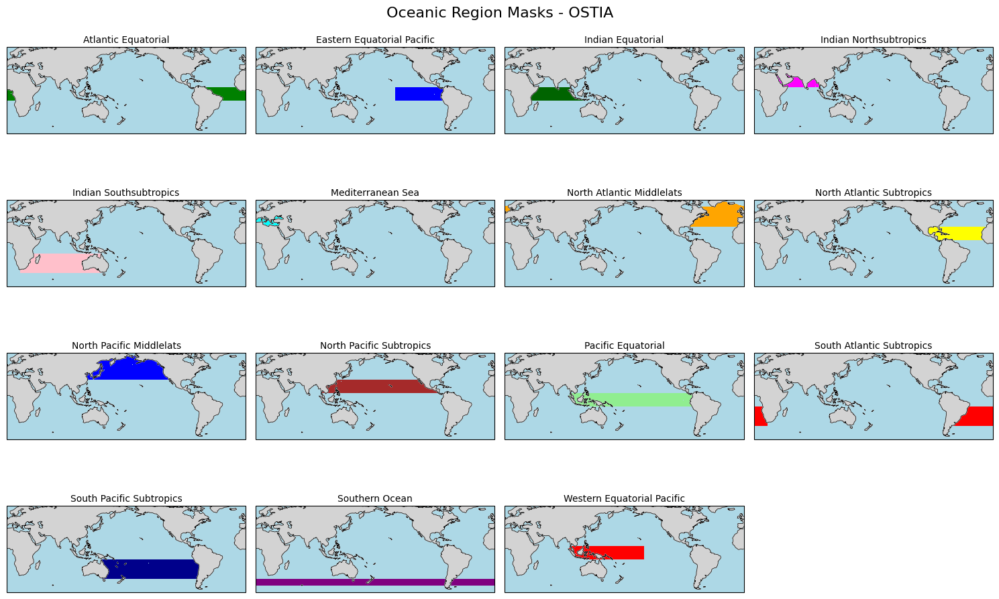

(<Figure size 1200x800 with 1 Axes>, <Figure size 1500x1000 with 16 Axes>)

In [12]:
# 1. Define your models dictionary with extreme events data
models_dict = {
    'OSTIA': o_ex,      # Your OSTIA extreme events data
    'ICON': i_ex,       # Your ICON extreme events data  
    'IFS-FESOM': f_ex,   # Your IFS-FESOM extreme events data
    'HadGEM3-LL': LL_ex,
    'HadGEM3-MM': MM_ex,
    'HadGEM3-HH': HH_ex
}


# After creating your masks dictionary
masks_dict = create_model_specific_masks(models_dict)

# Quick visualization for a specific model
quick_visualize_masks(masks_dict, 'OSTIA')



In [ ]:
# Or do it step by step for more control:

# Plot combined regions map
fig_combined, ax_combined = plot_combined_regions_mask(masks_dict, 'OSTIA')
plt.show()

# Plot individual masks in subplots
fig_individual, axes_individual = plot_model_masks(masks_dict, 'OSTIA')
plt.show()

# Visualize for all models
for model_name in masks_dict.keys():
    print(f"\nVisualizing {model_name} masks:")
    quick_visualize_masks(masks_dict, model_name)

# EXTREMES

In [11]:
# 1. Define your models dictionary with extreme events data
models_dict = {
    'OSTIA': o_ex,      # Your OSTIA extreme events data
    'ICON': i_ex,       # Your ICON extreme events data  
    'IFS-FESOM': f_ex,   # Your IFS-FESOM extreme events data
    'HadGEM3-LL': LL_ex,
    'HadGEM3-MM': MM_ex,
    'HadGEM3-HH': HH_ex
}


In [14]:
# Run the regional extremes analysis with different plot types

# Option A: Barchart (best for comparing models)
fig_barchart, ax_barchart, regional_data = quick_regional_extremes_analysis(
    models_dict,
    plot_type='barchart',
    per_grid_cell=True,
    normalize=True, # Use Set1 colormap
    title="Extreme days by oceanic region"
)
plt.show()

QUICK REGIONAL EXTREMES ANALYSIS WITH MODEL-SPECIFIC MASKS
COMPUTING REGIONAL EXTREMES WITH MODEL-SPECIFIC MASKS
Creating model-specific masks...
Creating masks for OSTIA...
Loading existing masks for model grid (480,) x (1440,)...
  OSTIA grid: (480,) x (1440,)
  OSTIA regions: ['Atlantic_Equatorial', 'Eastern_Equatorial_Pacific', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pacific_SubTropics', 'Pacific_Equatorial', 'South_Atlantic_SubTropics', 'South_Pacific_SubTropics', 'Southern_Ocean', 'Western_Equatorial_Pacific']
Creating masks for ICON...
Loading existing masks for model grid (481,) x (1440,)...
  ICON grid: (481,) x (1440,)
  ICON regions: ['Atlantic_Equatorial', 'Eastern_Equatorial_Pacific', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTrop

2025-12-12 17:22:30,540 - distributed.worker - ERROR - 
Traceback (most recent call last):
  File "/home/b/b382616/.conda/envs/super_trooper/lib/python3.14/asyncio/runners.py", line 204, in run
    return runner.run(main)
           ~~~~~~~~~~^^^^^^
  File "/home/b/b382616/.conda/envs/super_trooper/lib/python3.14/asyncio/runners.py", line 127, in run
    return self._loop.run_until_complete(task)
           ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~^^^^^^
  File "/home/b/b382616/.conda/envs/super_trooper/lib/python3.14/asyncio/base_events.py", line 706, in run_until_complete
    self.run_forever()
    ~~~~~~~~~~~~~~~~^^
  File "/home/b/b382616/.conda/envs/super_trooper/lib/python3.14/asyncio/base_events.py", line 677, in run_forever
    self._run_once()
    ~~~~~~~~~~~~~~^^
  File "/home/b/b382616/.conda/envs/super_trooper/lib/python3.14/asyncio/base_events.py", line 2008, in _run_once
    event_list = self._selector.select(timeout)
  File "/home/b/b382616/.conda/envs/super_trooper/lib/python3.14/s

KeyboardInterrupt: 

_bin = await stream.read_bytes(fmt_size)
                                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
asyncio.exceptions.CancelledError
2025-12-12 17:22:31,980 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
Traceback (most recent call last):
Traceback (most recent call last):
2025-12-12 17:22:30,542 - distributed.worker - ERROR - 
Traceback (most recent call last):
  File "/home/b/b382616/.conda/envs/super_trooper/lib/python3.14/asyncio/runners.py", line 204, in run
    return runner.run(main)
           ~~~~~~~~~~^^^^^^
  File "/home/b/b382616/.conda/envs/super_trooper/lib/python3.14/asyncio/runners.py", line 127, in run
    return self._loop.run_until_complete(task)
           ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~^^^^^^
  File "/home/b/b382616/.conda/envs/super_trooper/lib/python3.14/asyncio/base_events.py", line 706, in run_until_complete
    self.run_forever()
    ~~~~~~~~~~~~~~~~^^
  File "/home/b/b382616/.conda/envs/super_tro

In [ ]:
# 1. Define your models dictionary with extreme events data
models_dict = {
    'OSTIA': o_ex_s,      # Your OSTIA extreme events data
    'ICON': i_ex_s,       # Your ICON extreme events data  
    'IFS-FESOM': f_ex_s   # Your IFS-FESOM extreme events data
}


# Run the regional extremes analysis with different plot types

# Option A: Barchart (best for comparing models)
print("=== REGIONAL EXTREMES ANALYSIS - BARCHART ===")
fig_barchart, ax_barchart, regional_data = quick_regional_extremes_analysis(
    models_dict,
    plot_type='barchart',
    per_grid_cell=True,    # Normalize by grid cell count
    normalize=True,        # Normalize by years to get days/year
    title="SHIFTING BASELINE - Extreme days by oceanic region"
)
plt.show()

In [ ]:
# Option B: Heatmap (good for detailed comparisons)
print("\n=== REGIONAL EXTREMES ANALYSIS - HEATMAP ===")
fig_heatmap, ax_heatmap, regional_data = quick_regional_extremes_analysis(
    models_dict,
    plot_type='heatmap',
    per_grid_cell=True,
    normalize=True,
    title="Extreme days heatmap"
)
plt.show()



In [ ]:
# Option C: Single model view
print("\n=== REGIONAL EXTREMES ANALYSIS - SINGLE MODEL ===")
fig_single, ax_single, regional_data = quick_regional_extremes_analysis(
    models_dict,
    plot_type='single',
    per_grid_cell=True,
    normalize=True,
    title_template="{} - Regional Extreme Events"
)
plt.show()

# MHW EVENTS

In [10]:
o_ex=o_ex.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})
i_ex=i_ex.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})
f_ex=f_ex.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})


In [11]:
models_dict = {
    'OSTIA': o_ex,      # Your OSTIA extreme events data
    'ICON': i_ex,       # Your ICON extreme events data  
    'IFS-FESOM': f_ex   # Your IFS-FESOM extreme events data
}


In [12]:
# 1. Compute MHW events for all models
mhw_events_dict = compute_mhw_events_for_models(
    models_dict,
    min_duration=5,      # Minimum event duration in days
    max_gap=2,           # Maximum gap between events to merge
    max_events_per_cell=1000
)



COMPUTING MHW EVENTS FOR ALL MODELS
Processing OSTIA...
Creating MHW event dataset...
  Total events: 16190659
  Average duration: 11.9 days
Processing ICON...
Creating MHW event dataset...
  Total events: 15302523
  Average duration: 13.4 days
Processing IFS-FESOM...
Creating MHW event dataset...
  Total events: 15846508
  Average duration: 14.0 days


QUICK MHW EVENTS ANALYSIS
COMPUTING MHW EVENTS FOR ALL MODELS
Processing OSTIA...
Creating MHW event dataset...


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.39 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.43 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Total events: 16190659
  Average duration: 11.9 days
Processing ICON...
Creating MHW event dataset...


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.40 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.44 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Total events: 15302523
  Average duration: 13.4 days
Processing IFS-FESOM...
Creating MHW event dataset...


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.40 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.44 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Total events: 15846508
  Average duration: 14.0 days
Creating model-specific masks...
Creating masks for OSTIA...
Loading existing masks for model grid (480,) x (1440,)...
  OSTIA grid: (480,) x (1440,)
  OSTIA regions: ['Atlantic_Equatorial', 'Eastern_Equatorial_Pacific', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pacific_SubTropics', 'Pacific_Equatorial', 'South_Atlantic_SubTropics', 'South_Pacific_SubTropics', 'Southern_Ocean', 'Western_Equatorial_Pacific']
Creating masks for ICON...
Loading existing masks for model grid (481,) x (1440,)...
  ICON grid: (481,) x (1440,)
  ICON regions: ['Atlantic_Equatorial', 'Eastern_Equatorial_Pacific', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pacific_SubTropic

/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.57 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.61 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Atlantic_Equatorial: 34.1 events, 9.9 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.57 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.61 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Eastern_Equatorial_Pacific: 22.0 events, 23.2 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.57 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.61 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Indian_Equatorial: 33.0 events, 10.8 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.57 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.61 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Indian_NorthSubTropics: 36.4 events, 9.6 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.57 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.61 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Indian_SouthSubTropics: 35.0 events, 11.3 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.57 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.61 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Mediterranean_Sea: 36.0 events, 10.7 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.57 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.61 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  North_Atlantic_MiddleLats: 36.1 events, 11.4 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.57 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.61 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  North_Atlantic_SubTropics: 33.6 events, 10.8 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.57 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.61 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  North_Pacific_MiddleLats: 33.5 events, 13.2 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.57 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.61 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  North_Pacific_SubTropics: 34.2 events, 11.1 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.57 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.61 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Pacific_Equatorial: 30.5 events, 13.8 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.57 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.61 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  South_Atlantic_SubTropics: 34.6 events, 11.3 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.57 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.61 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  South_Pacific_SubTropics: 34.1 events, 11.9 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.57 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.61 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Southern_Ocean: 35.2 events, 11.7 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.57 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.61 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Western_Equatorial_Pacific: 36.7 events, 9.8 days avg duration
Processing ICON...


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Atlantic_Equatorial: 32.5 events, 11.0 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Eastern_Equatorial_Pacific: 33.9 events, 12.0 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Indian_Equatorial: 35.7 events, 9.4 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Indian_NorthSubTropics: 37.0 events, 10.7 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Indian_SouthSubTropics: 34.2 events, 12.2 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Mediterranean_Sea: 33.1 events, 12.6 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  North_Atlantic_MiddleLats: 32.5 events, 14.0 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  North_Atlantic_SubTropics: 32.4 events, 13.2 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  North_Pacific_MiddleLats: 31.0 events, 15.0 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  North_Pacific_SubTropics: 31.0 events, 13.9 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Pacific_Equatorial: 33.7 events, 11.3 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  South_Atlantic_SubTropics: 32.8 events, 13.6 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  South_Pacific_SubTropics: 29.4 events, 15.2 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Southern_Ocean: 31.5 events, 14.9 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Western_Equatorial_Pacific: 34.4 events, 10.8 days avg duration
Processing IFS-FESOM...


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Atlantic_Equatorial: 34.8 events, 12.8 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Eastern_Equatorial_Pacific: 36.2 events, 12.6 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Indian_Equatorial: 38.5 events, 11.4 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Indian_NorthSubTropics: 36.7 events, 13.0 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Indian_SouthSubTropics: 33.2 events, 14.1 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Mediterranean_Sea: 35.9 events, 13.1 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  North_Atlantic_MiddleLats: 34.6 events, 13.5 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  North_Atlantic_SubTropics: 33.1 events, 14.1 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  North_Pacific_MiddleLats: 31.9 events, 15.6 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  North_Pacific_SubTropics: 34.3 events, 13.5 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Pacific_Equatorial: 36.2 events, 11.7 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  South_Atlantic_SubTropics: 32.8 events, 14.5 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  South_Pacific_SubTropics: 31.9 events, 14.9 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Southern_Ocean: 31.4 events, 15.7 days avg duration


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  Western_Equatorial_Pacific: 37.2 events, 11.1 days avg duration

CREATING SPATIAL MAPS...


/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.16 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.39 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


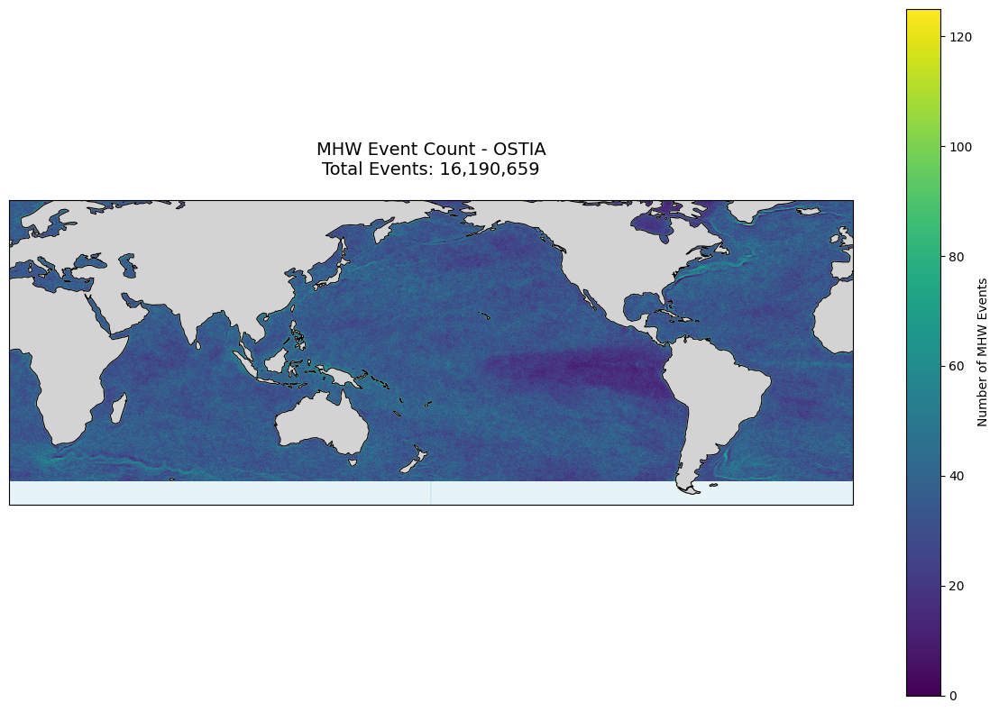

/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.41 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.54 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


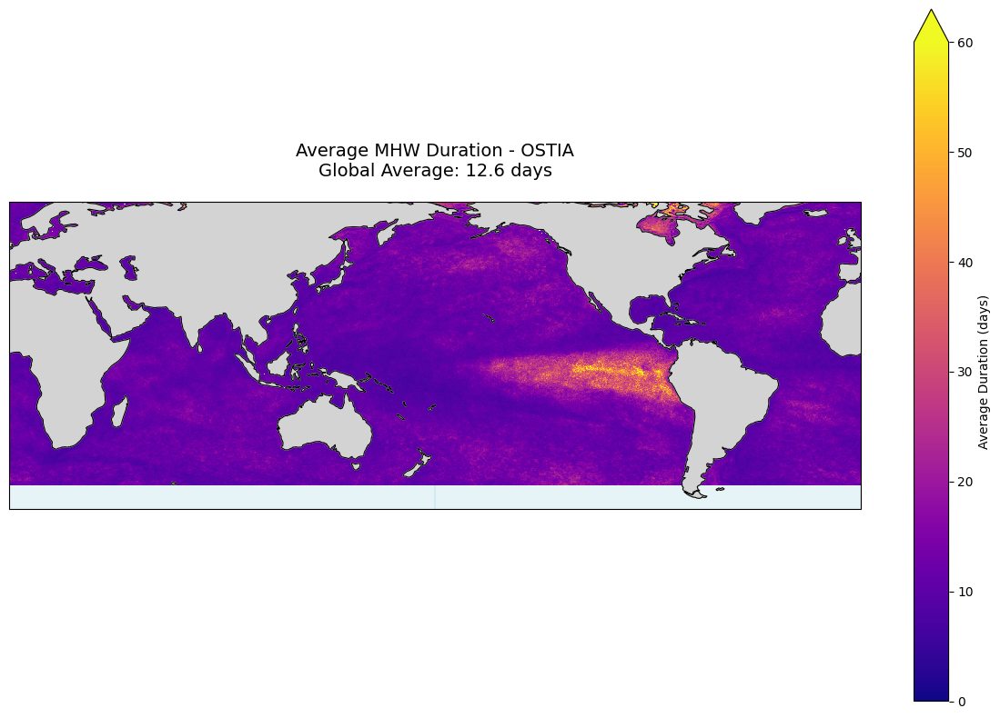

/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.40 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


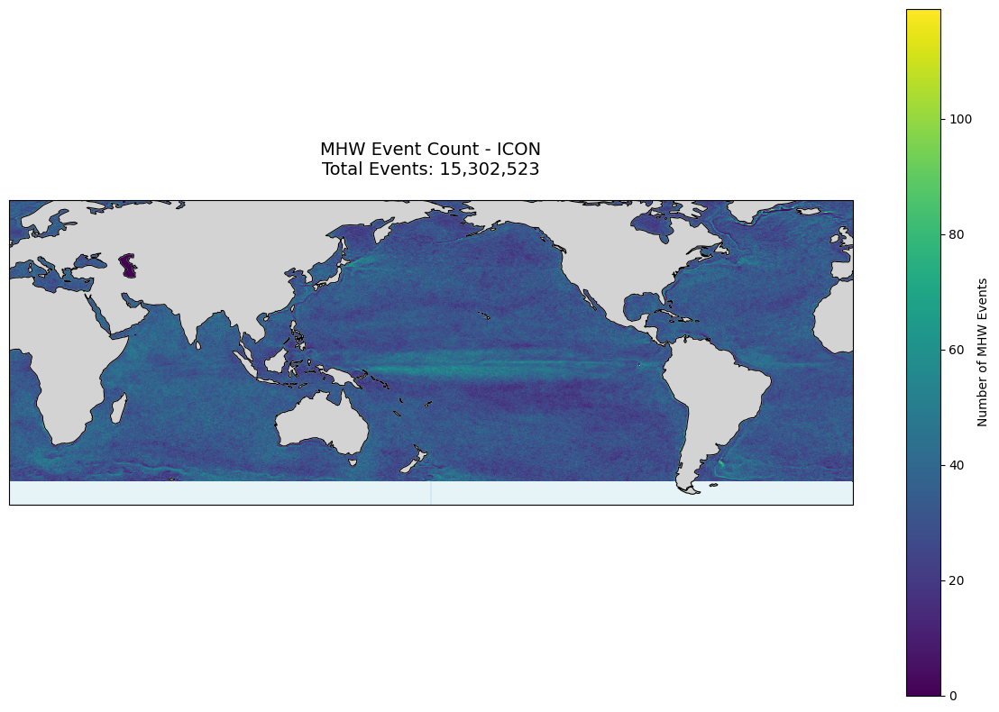

/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.42 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.56 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


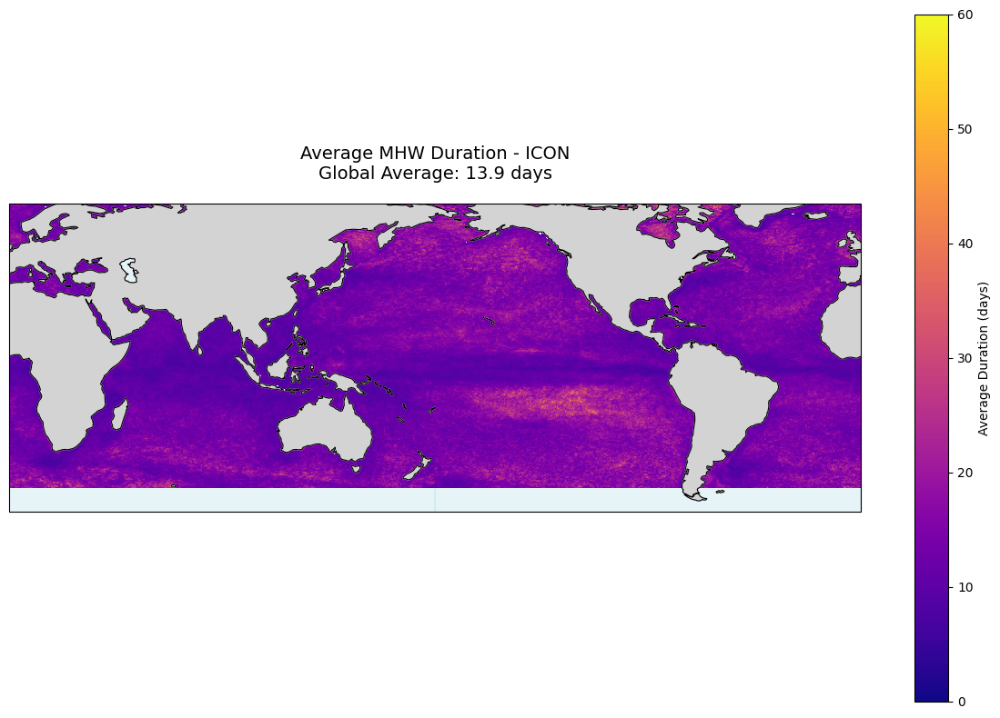

/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.40 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


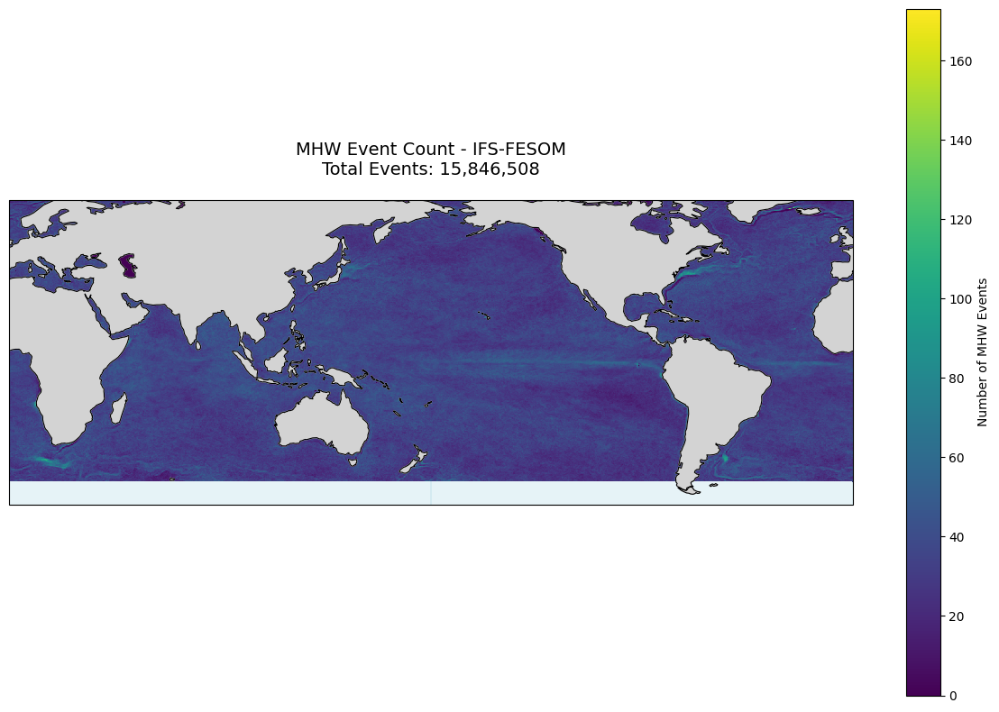

/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.42 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.56 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


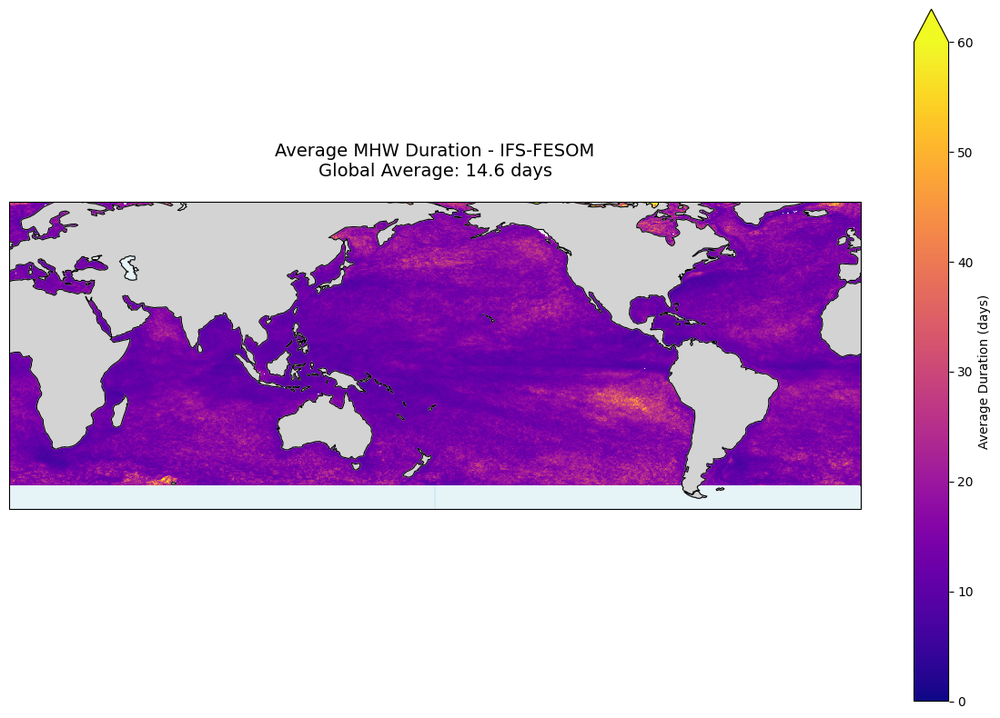


CREATING REGIONAL COMPARISONS...
PLOTTING REGIONAL MHW EVENT_COUNT BARCHART


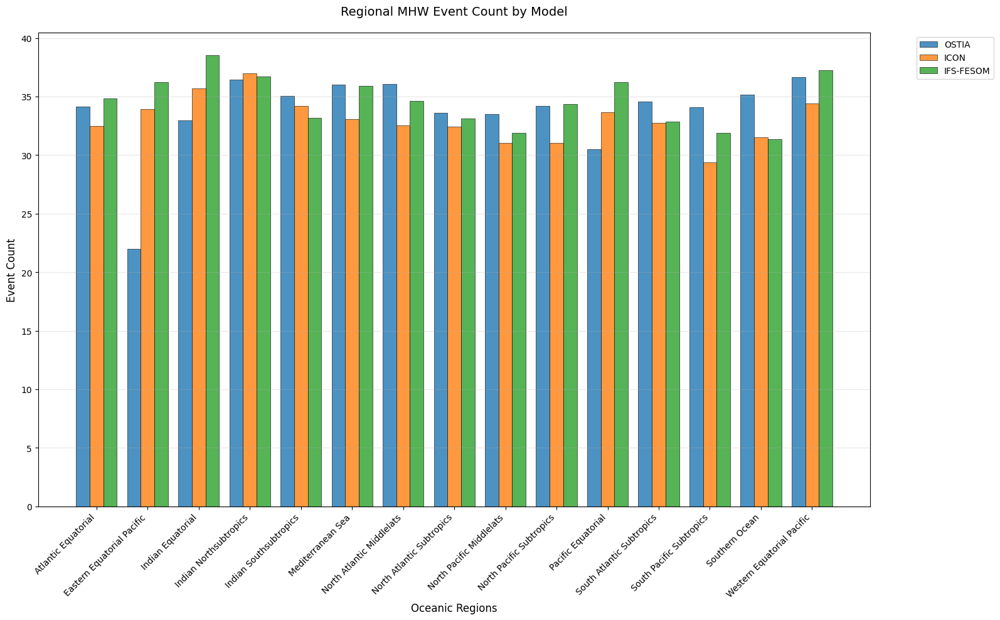

PLOTTING REGIONAL MHW TOTAL_EVENT_DAYS BARCHART


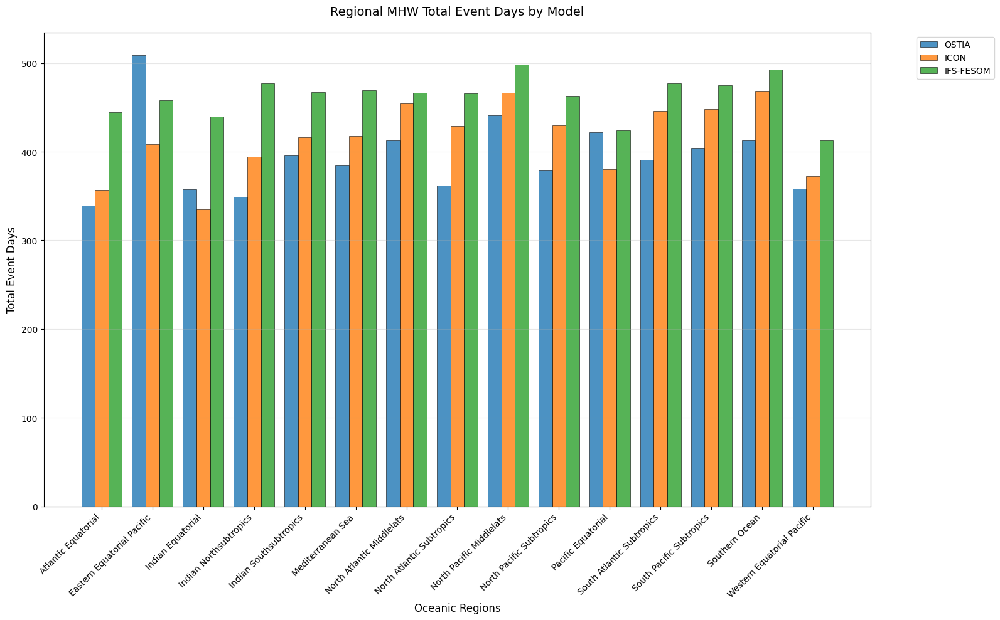

PLOTTING REGIONAL MHW AVG_DURATION BARCHART


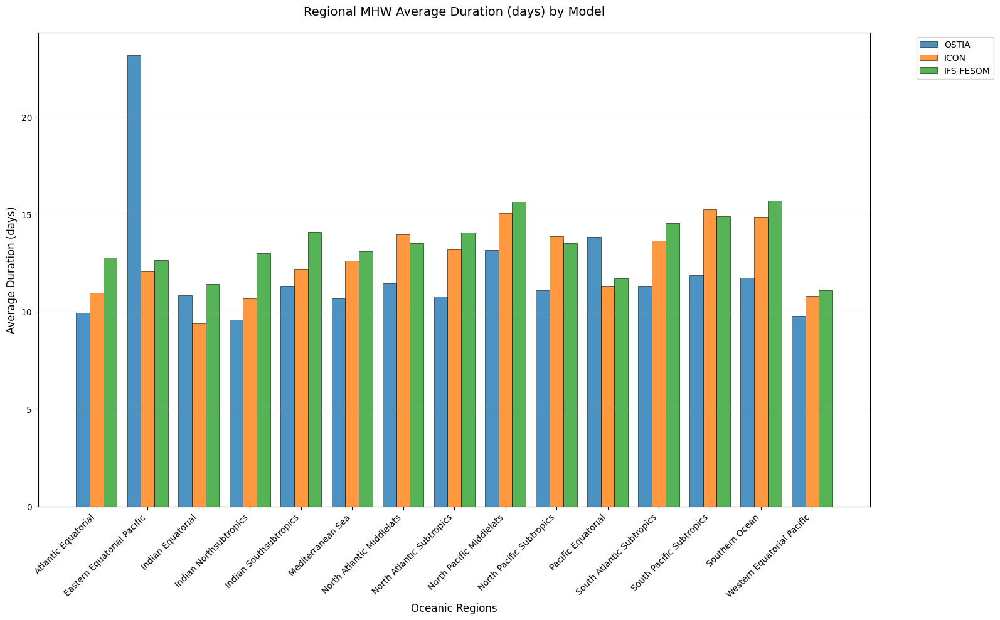

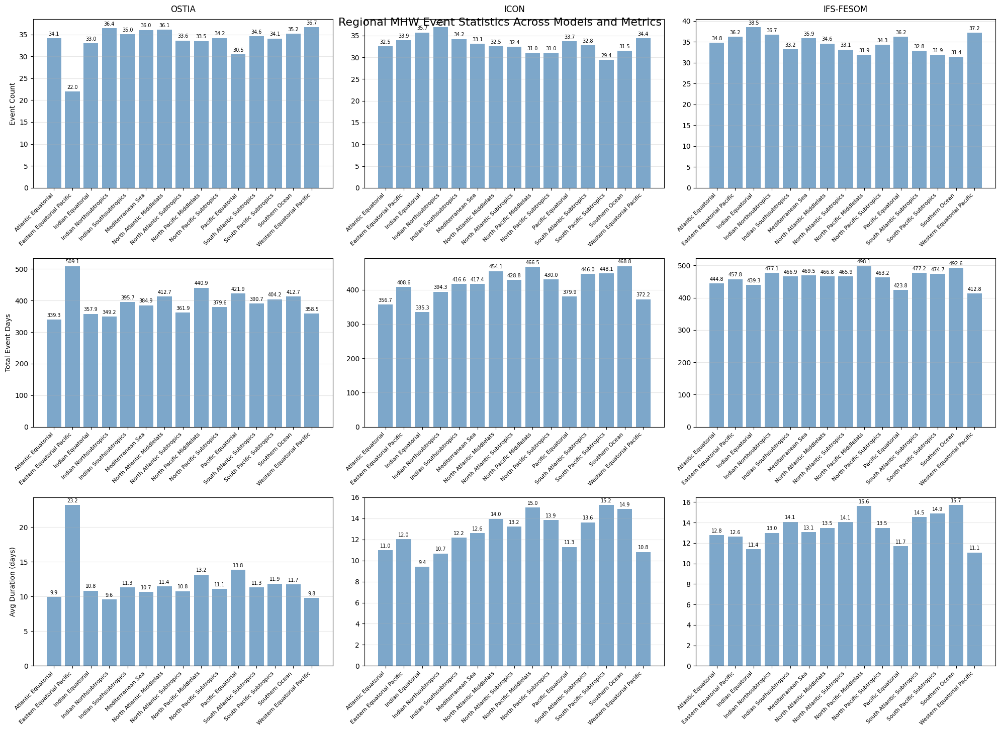

In [20]:
# Use the quick analysis function with custom colorbar limits
mhw_events_dict, regional_mhw_data, masks_dict = quick_mhw_events_analysis(
    models_dict,
    min_duration=5,
    max_gap=2,
    plot_maps=True,           # This will show maps automatically
    plot_regional=True,    # Maximum value for event count colorbar  
    vmin_avg_duration=0,      # Minimum value for average duration colorbar
    vmax_avg_duration=60      # Maximum value for average duration colorbar
)

## to pick wich graphs

In [12]:
o_ex=o_ex.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})
i_ex=i_ex.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})
f_ex=f_ex.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})

models_dict = {
    'OSTIA': o_ex,      # Your OSTIA extreme events data
    'ICON': i_ex,       # Your ICON extreme events data  
    'IFS-FESOM': f_ex   # Your IFS-FESOM extreme events data
}


SELECTIVE MHW ANALYSIS - SHOWING ONLY SPECIFIED PLOTS
Plots to show: ['regional_events', 'regional_event_days', 'regional_duration']
QUICK MHW EVENTS ANALYSIS
COMPUTING MHW EVENTS FOR ALL MODELS
Processing OSTIA...
Creating MHW event dataset...
  Total events: 16190659
  Average duration: 11.9 days
Processing ICON...
Creating MHW event dataset...
  Total events: 15302523
  Average duration: 13.4 days
Processing IFS-FESOM...
Creating MHW event dataset...
  Total events: 15846317
  Average duration: 14.0 days
Creating model-specific masks...
Creating masks for OSTIA...
Loading existing masks for model grid (480,) x (1440,)...
  OSTIA grid: (480,) x (1440,)
  OSTIA regions: ['Atlantic_Equatorial', 'Eastern_Equatorial_Pacific', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pacific_SubTropics', 'Pacific_Equatorial', 'South_Atlantic_SubTropics', 'South_

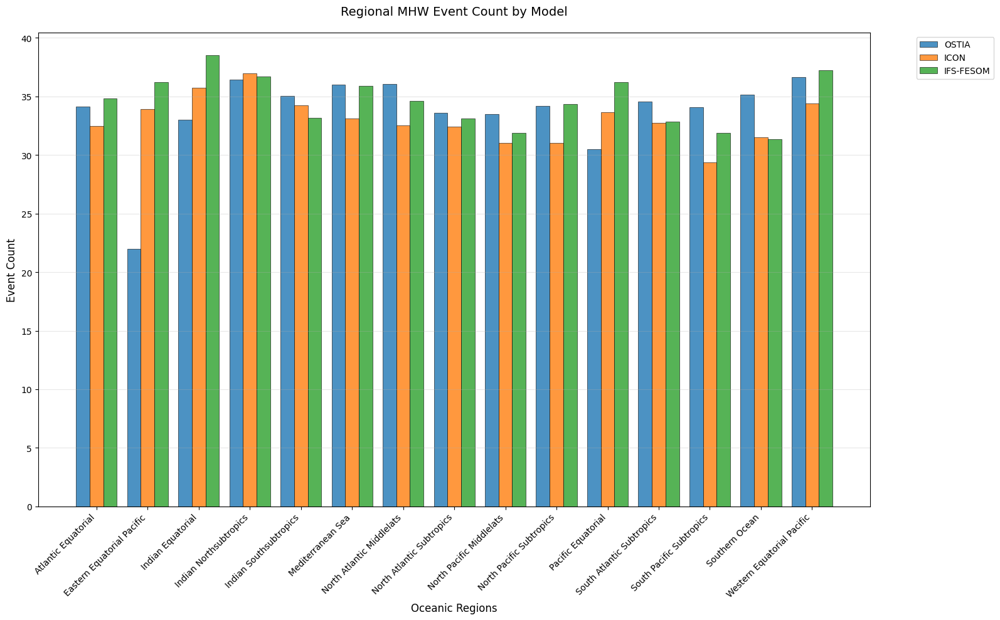


Creating regional duration barchart...
PLOTTING REGIONAL MHW AVG_DURATION BARCHART


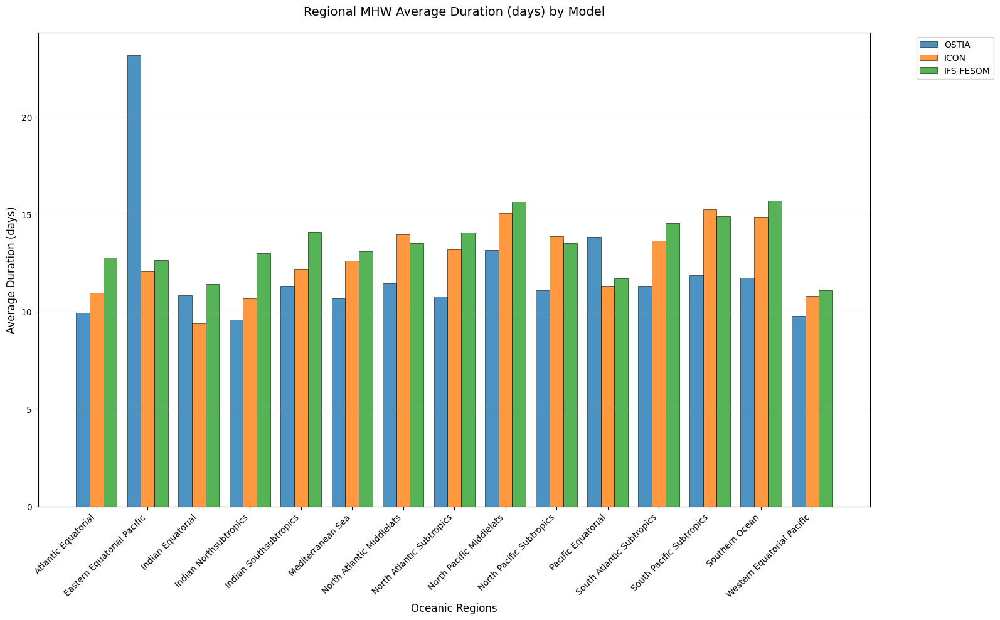


Creating regional event days barchart...
PLOTTING REGIONAL MHW TOTAL_EVENT_DAYS BARCHART


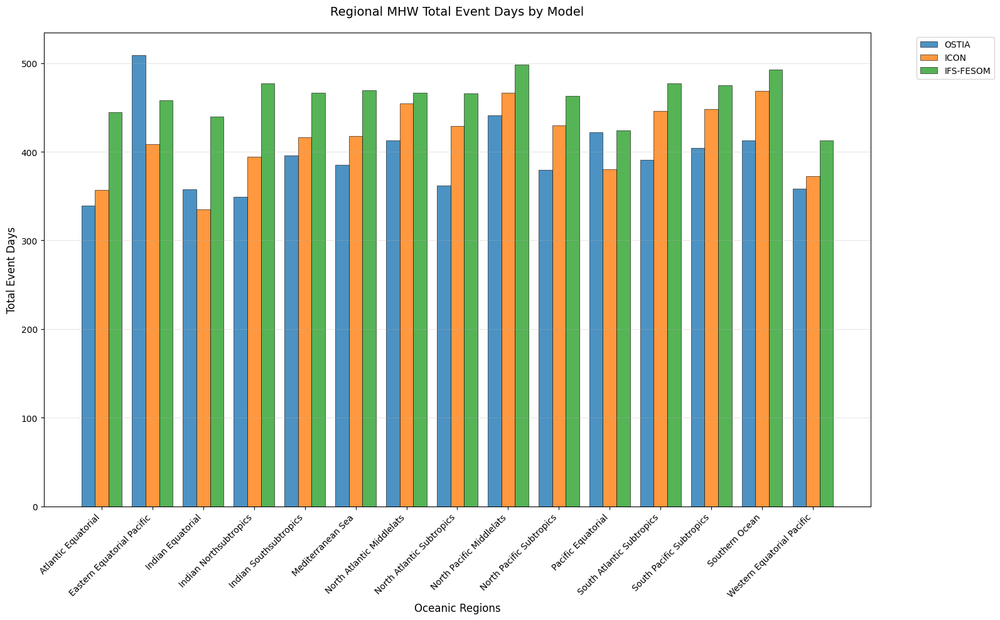

({'OSTIA': <xarray.Dataset> Size: 1GB
  Dimensions:            (lat: 480, lon: 1440, event_index: 100)
  Coordinates:
    * lat                (lat) float32 2kB -49.88 -49.62 -49.38 ... 69.62 69.88
    * lon                (lon) float32 6kB -179.9 -179.6 -179.4 ... 179.6 179.9
    * event_index        (event_index) int64 800B 0 1 2 3 4 5 ... 95 96 97 98 99
  Data variables:
      event_count        (lat, lon) int32 3MB dask.array<chunksize=(50, 50), meta=np.ndarray>
      event_durations    (lat, lon, event_index) int32 276MB dask.array<chunksize=(50, 50, 100), meta=np.ndarray>
      event_start_times  (lat, lon, event_index) datetime64[ns] 553MB dask.array<chunksize=(50, 50, 100), meta=np.ndarray>
      event_end_times    (lat, lon, event_index) datetime64[ns] 553MB dask.array<chunksize=(50, 50, 100), meta=np.ndarray>,
  'ICON': <xarray.Dataset> Size: 1GB
  Dimensions:            (lat: 481, lon: 1440, event_index: 100)
  Coordinates:
    * lat                (lat) float64 4kB -50.0 -4

In [13]:
selective_mhw_analysis(
    models_dict,
    plots_to_show=['regional_events', 'regional_event_days', 'regional_duration'],
    min_duration=5,
    max_gap=2,
    max_events_per_cell=100
)

In [ ]:
# Print the function's docstring to see the available options
print(selective_mhw_analysis.__doc__)

# MHW Magnitude Plotting Functions



## Single Model Map Plots

### `plot_avg_intensity_map`
- **What it plots**: Average of event average intensities per grid cell
- **Default title**: "MHW average intensity of all average intensities"
- **Parameters**: 
  - `intensity_ds`: Intensity dataset
  - `model_name`: Model identifier
  - `figsize`: Figure dimensions
  - `central_longitude`: Map projection center
  - `vmin`, `vmax`: Color scale limits
  - `title`: Custom title (optional)

### `plot_avg_of_max_intensity_map`
- **What it plots**: Average of event maximum intensities per grid cell
- **Default title**: "MHW average intensity of all maximum intensities"
- **Parameters**: Same as above

### `plot_max_intensity_map`
- **What it plots**: Maximum of event maximum intensities per grid cell
- **Default title**: "MHW max intensity of all max intensities"
- **Parameters**: Same as above

## Multi-Model Comparison Plots

### `plot_multi_model_intensity_maps`
- **What it plots**: Grid of maps for multiple models
- **Parameters**:
  - `intensity_dict`: Dictionary of {model_name: intensity_ds}
  - `plot_type`: One of: `'avg_intensity'` (average of averages), `'avg_of_max_intensity'` (average of maxima), `'max_intensity'` (maxima of maxima)
  - `figsize`, `central_longitude`, `vmin`, `vmax`: Same as single plots
  - `titles`: Dictionary of custom titles per model

## Duration vs Intensity Relationship Plots

### `plot_duration_intensity_scatter`
- **What it plots**: 3 scatter plots (duration vs avg/max/median intensity)
- **Parameters**:
  - `mhw_events_ds`: MHW events dataset (contains durations)
  - `intensity_ds`: Intensity dataset
  - `model_name`: Model identifier
  - `max_points`: Maximum points to plot (for performance)
  - `figsize`: Figure dimensions

### `plot_duration_intensity_hist2d`
- **What it plots**: 3 density plots (2D histograms) of duration vs intensity
- **Parameters**: Same as scatter plots

## Convenience Functions

### `create_all_intensity_plots`
- **What it plots**: All plots for single or multiple models
- **Parameters**:
  - `mhw_events_dict`: Dictionary of {model_name: mhw_events_ds}
  - `intensity_dict`: Dictionary of {model_name: intensity_ds}
  - `model_names`: List of models to plot (optional)

In [ ]:
o_ex=o_ex.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})
i_ex=i_ex.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})
f_ex=f_ex.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})


models_dict = {
    'OSTIA': o_ex,      # Your OSTIA extreme events data
    'ICON': i_ex,       # Your ICON extreme events data  
    'IFS-FESOM': f_ex   # Your IFS-FESOM extreme events data
}


In [ ]:
# Your existing setup
o_mhws = create_mhw_event_dataset(o_ex, min_duration=5, max_gap=2, max_events_per_cell=100)
i_mhws = create_mhw_event_dataset(i_ex, min_duration=5, max_gap=2, max_events_per_cell=100)  
f_mhws = create_mhw_event_dataset(f_ex, min_duration=5, max_gap=2, max_events_per_cell=100)

In [ ]:
ossta=ossta.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})
issta=issta.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})
fssta=fssta.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})


models_ssta= {
    'OSTIA': ossta,     
    'ICON': issta,      
    'IFS-FESOM': fssta  
}

In [ ]:

o_mag = compute_event_magnitude_vectorized(o_mhws, ossta)

i_mag = compute_event_magnitude_vectorized(i_mhws, issta)

f_mag = compute_event_magnitude_vectorized(f_mhws, fssta)



In [ ]:
# Multiple models
magnitude_dict = {
    'OSTIA': o_mag,
    'ICON': i_mag, 
    'IFS-FESOM': f_mag
}

In [ ]:


# Multiple models (now using magnitude_dict instead of intensity_dict)
magnitude_dict = {
    'OSTIA': o_mag,
    'ICON': i_mag, 
    'IFS-FESOM': f_mag
}
# Plot maximum magnitude for all models with consistent color scale
fig, axes = plot_multi_model_magnitude_maps(
    magnitude_dict, 
    plot_type='max_magnitude',
    vmin=0, vmax=4,  # Consistent color scale across all models
    titles={
        'OSTIA': 'OSTIA: Max of max Magnitude',
        'ICON': 'ICON: Max of max Magnitude', 
        'IFS-FESOM': 'IFS-FESOM: Max of max Magnitude'
    }
)


# Plot average magnitude for all models with consistent color scale
fig, axes = plot_multi_model_magnitude_maps(
    magnitude_dict, 
    plot_type='avg_magnitude',
    vmin=0, vmax=4,  # Consistent color scale across all models
    titles={
        'OSTIA': 'OSTIA: Avg Magnitude',
        'ICON': 'ICON: Avg Magnitude', 
        'IFS-FESOM': 'IFS-FESOM: Avg Magnitude'
    }
)

# Plot average of maximum magnitudes for all models with consistent color scale
fig, axes = plot_multi_model_magnitude_maps(
    magnitude_dict, 
    plot_type='avg_of_max_magnitude',
    vmin=0, vmax=4,  # Consistent color scale across all models
    titles={
        'OSTIA': 'OSTIA: Avg of max Magnitude',
        'ICON': 'ICON: Avg of max Magnitude', 
        'IFS-FESOM': 'IFS-FESOM: Avg of max Magnitude'
    }
)

# Time series
## here we have two main functions, one is:
plot_sst_with_event_markers
## which gives you the classic hobday time-series plot with SST, climatology and threshold. Red fille area corresponds to extremes. Actual MHW events are marked by dashed lines.

## The other function is:
plot_sst_trim_mhw_events
## which gives you a similar plot, but only plots times when there were MHW events, the trimmes segments are shown back to back

### you need to first run compute_mhw_events_for_models

In [20]:
o_ex=o_ex.chunk(chunks={'time': 100, 'lat': 50, 'lon': 50})
i_ex=i_ex.chunk(chunks={'time': 100, 'lat': 50, 'lon': 50})
f_ex=f_ex.chunk(chunks={'time': 100, 'lat': 50, 'lon': 50})


In [21]:
models_dict = {
    'OSTIA': o_ex,      # Your OSTIA extreme events data
    'ICON': i_ex,       # Your ICON extreme events data  
    'IFS-FESOM': f_ex   # Your IFS-FESOM extreme events data
}

masks_dict = create_model_specific_masks(models_dict)

Creating model-specific masks...
Creating masks for OSTIA...
Loading existing masks for model grid (480,) x (1440,)...
  OSTIA grid: (480,) x (1440,)
  OSTIA regions: ['Atlantic_Equatorial', 'Eastern_Equatorial_Pacific', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pacific_SubTropics', 'Pacific_Equatorial', 'South_Atlantic_SubTropics', 'South_Pacific_SubTropics', 'Southern_Ocean', 'Western_Equatorial_Pacific']
Creating masks for ICON...
Loading existing masks for model grid (481,) x (1440,)...
  ICON grid: (481,) x (1440,)
  ICON regions: ['Atlantic_Equatorial', 'Eastern_Equatorial_Pacific', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pacific_SubTropics', 'Pacific_Equatorial', 'South_Atlantic_SubTropics', 

In [22]:
model_data_mapping = {
    'OSTIA': {
        'sst': sst,
        'ssta': ossta,
        'thresholds': ds.thresholds,
        'mhw_events': mhw_events_dict['OSTIA']
    },
    'ICON': {
        'sst': sst_ic,
        'ssta': issta,
        'thresholds': i_ds.thresholds,
        'mhw_events': mhw_events_dict['ICON']
    },
    'IFS-FESOM': {
        'sst': sst_f,
        'ssta': fssta,
        'thresholds': f_ds.thresholds,
        'mhw_events': mhw_events_dict['IFS-FESOM']
    }
}


Trimmed to 450 days around 36 MHW events

Displaying 450 days around 36 MHW events:
------------------------------------------------------------
Segment 1: 1982-01-14 to 1982-01-25 (12 days)
Segment 2: 1982-08-16 to 1982-08-27 (12 days)
Segment 3: 1986-10-12 to 1986-10-20 (9 days)
Segment 4: 1989-11-17 to 1989-11-27 (11 days)
Segment 5: 1990-02-12 to 1990-03-04 (21 days)
Segment 6: 1990-03-13 to 1990-03-21 (9 days)
Segment 7: 1990-05-22 to 1990-06-25 (35 days)
Segment 8: 1990-07-08 to 1990-07-16 (9 days)
Segment 9: 1991-04-27 to 1991-05-04 (8 days)
Segment 10: 1996-01-25 to 1996-02-02 (9 days)
Segment 11: 1996-05-03 to 1996-05-13 (11 days)
Segment 12: 1998-09-19 to 1998-09-27 (9 days)
Segment 13: 1998-12-13 to 1998-12-20 (8 days)
Segment 14: 2002-05-16 to 2002-05-23 (8 days)
Segment 15: 2002-07-06 to 2002-07-15 (10 days)
Segment 16: 2002-07-18 to 2002-07-27 (10 days)
Segment 17: 2002-09-29 to 2002-10-09 (11 days)
Segment 18: 2002-11-01 to 2002-11-30 (30 days)
Segment 19: 2006-03-30 to 

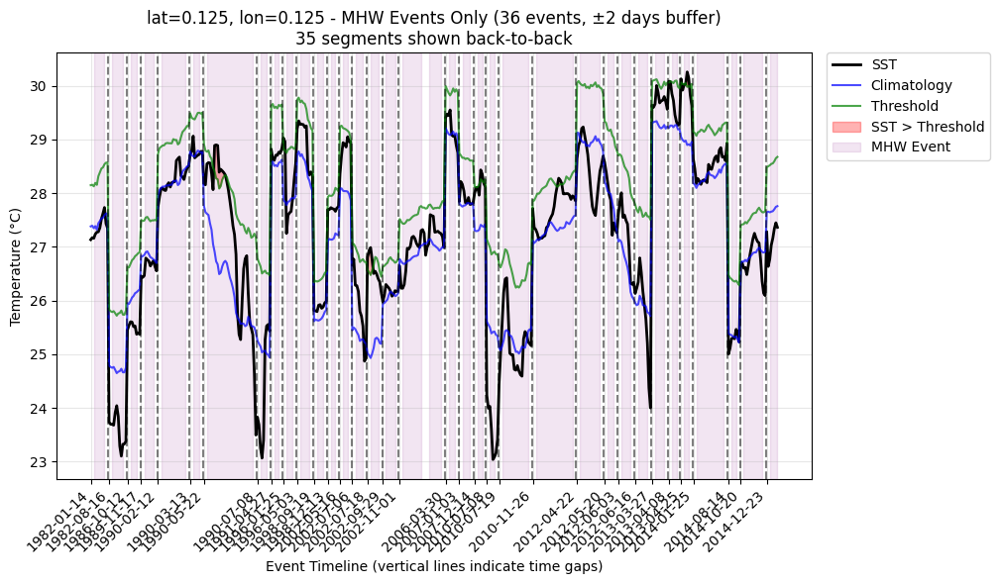

In [15]:
# PLOT TRIMMED TIME SERIES BASIC USAGE
fig2, events2 = plot_sst_trim_mhw_events(
    sst, ossta, ds.thresholds,
    mhw_events_dict['IFS-FESOM'],
    lat=0, lon=0,
    trim_to_events=True,
    buffer_days=2
)


In [ ]:
# PLOT TIME SERIES BASIC USAGE
fig = plot_sst_with_event_markers(
    sst,                    # OSTIA SST data
    ossta,                  # OSTIA SSTA data
    ds.thresholds,          # OSTIA thresholds
    mhw_events_dict['OSTIA'],  # OSTIA MHW events
    lat=0,                  # Latitude
    lon=160                 # Longitude
)
plt.show()

In [ ]:
# ============================================
# let's look at TRIMMED TIME SERIES FOR MULTIPLE POINTS
# ============================================

In [16]:
# ============================================
# DEFINE POINTS OF INTEREST
# ============================================
points_of_interest = [
    # Western Equatorial Pacific points
    {"name": "Western_EQ_Pacific_1", "lat": 0, "lon": 160},
    {"name": "Western_EQ_Pacific_2", "lat": 5, "lon": 170},
    {"name": "Western_EQ_Pacific_3", "lat": -5, "lon": 150},
    
    # Eastern Equatorial Pacific points  
    {"name": "Eastern_EQ_Pacific_1", "lat": 0, "lon": -110},
    {"name": "Eastern_EQ_Pacific_2", "lat": 5, "lon": -120},
    {"name": "Eastern_EQ_Pacific_3", "lat": -5, "lon": -100},
]

points_of_interest = [
    {"name": "Western_EQ_Pacific_1", "lat": 0, "lon": 160},
    {"name": "Western_EQ_Pacific_2", "lat": 5, "lon": 170},
    {"name": "Western_EQ_Pacific_3", "lat": -5, "lon": 150},
    
    # Eastern Equatorial Pacific points  
    {"name": "Eastern_EQ_Pacific_1", "lat": 0, "lon": -110},
    {"name": "Eastern_EQ_Pacific_2", "lat": 5, "lon": -120},
    {"name": "Eastern_EQ_Pacific_3", "lat": -5, "lon": -100},
    
    # Atlantic Equatorial
    {"name": "Atlantic_Equatorial", "lat": 0, "lon": -30},
    
    # Indian Equatorial
    {"name": "Indian_Equatorial", "lat": 0, "lon": 60},
    
    # North Pacific Subtropics
    {"name": "North_Pacific_SubTropics", "lat": 20, "lon": -150},
    
    # North Pacific Middle Latitudes
    {"name": "North_Pacific_MiddleLats", "lat": 40, "lon": -150},
    
    # South Pacific Subtropics
    {"name": "South_Pacific_SubTropics", "lat": -20, "lon": -150},
    
    # North Atlantic Subtropics
    {"name": "North_Atlantic_SubTropics", "lat": 20, "lon": -40},
    
    # North Atlantic Middle Latitudes
    {"name": "North_Atlantic_MiddleLats", "lat": 40, "lon": -40},
    
    # South Atlantic Subtropics
    {"name": "South_Atlantic_SubTropics", "lat": -20, "lon": -10},
    
    # Indian North Subtropics
    {"name": "Indian_NorthSubTropics", "lat": 20, "lon": 60},
    
    # Indian South Subtropics
    {"name": "Indian_SouthSubTropics", "lat": -20, "lon": 60},
    
    # Southern Ocean
    {"name": "Southern_Ocean", "lat": -45, "lon": -60},
    
    # Mediterranean Sea
    {"name": "Mediterranean_Sea", "lat": 35, "lon": 15},
]


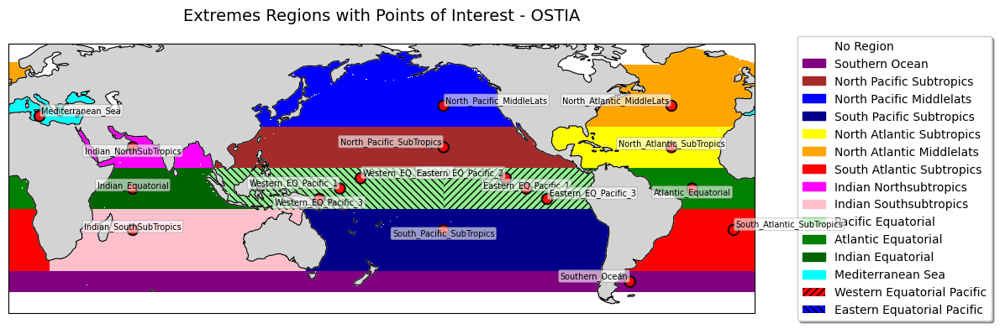

In [26]:
# ============================================
# VISUALISE POINTS OF INTEREST
# ============================================


fig, ax = plot_points_on_masks(
    masks_dict,
    model_name='OSTIA',
    points_of_interest=points_of_interest,
    point_size=80,
    label_fontsize=7,  # Smaller font
    label_alpha=0.6,   # More transparent
    label_offset=(1, 0.5)  # Smaller offset
)
plt.show()


Trimmed to 430 days around 34 MHW events

Displaying 430 days around 34 MHW events:
------------------------------------------------------------
Segment 1: 1983-07-18 to 1983-08-02 (16 days)
Segment 2: 1985-08-19 to 1985-09-09 (22 days)
Segment 3: 1986-02-22 to 1986-03-02 (9 days)
Segment 4: 1990-01-01 to 1990-01-09 (9 days)
Segment 5: 1990-02-26 to 1990-03-06 (9 days)
Segment 6: 1990-03-26 to 1990-04-04 (10 days)
Segment 7: 1990-05-27 to 1990-06-15 (20 days)
Segment 8: 1990-07-14 to 1990-07-23 (10 days)
Segment 9: 1990-09-26 to 1990-10-14 (19 days)
Segment 10: 1990-10-31 to 1990-11-12 (13 days)
Segment 11: 1991-03-05 to 1991-03-19 (15 days)
Segment 12: 1991-04-05 to 1991-04-20 (16 days)
Segment 13: 1991-06-11 to 1991-06-19 (9 days)
Segment 14: 1994-11-23 to 1994-12-04 (12 days)
Segment 15: 1995-02-01 to 1995-02-10 (10 days)
Segment 16: 1995-03-17 to 1995-03-25 (9 days)
Segment 17: 1995-05-12 to 1995-05-21 (10 days)
Segment 18: 1995-12-09 to 1995-12-18 (10 days)
Segment 19: 1995-12-22 

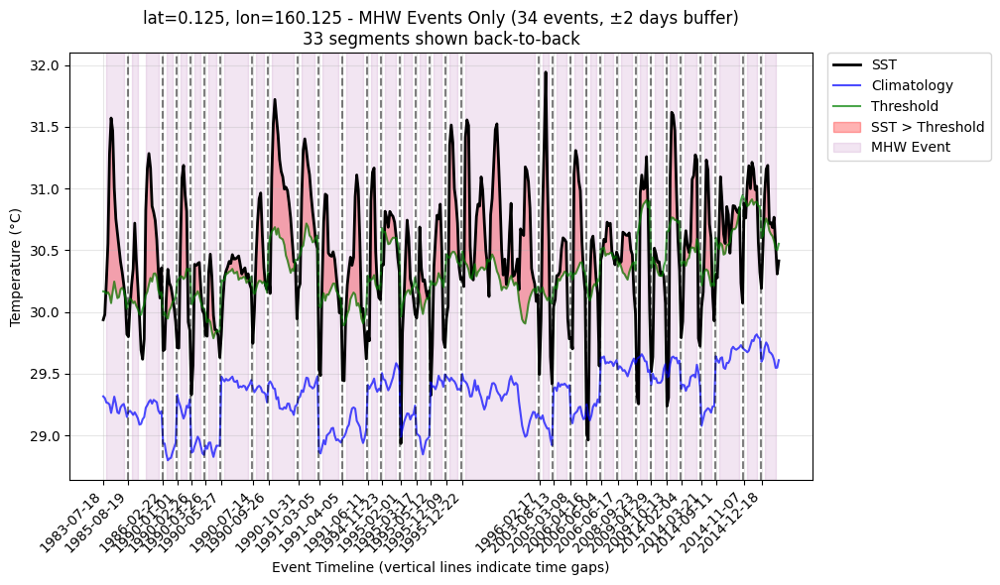

Trimmed to 413 days around 33 MHW events

Displaying 413 days around 33 MHW events:
------------------------------------------------------------
Segment 1: 1982-01-09 to 1982-01-18 (10 days)
Segment 2: 1982-10-29 to 1982-11-17 (20 days)
Segment 3: 1983-05-05 to 1983-05-15 (11 days)
Segment 4: 1983-05-29 to 1983-07-06 (39 days)
Segment 5: 1983-07-22 to 1983-08-12 (22 days)
Segment 6: 1983-09-17 to 1983-09-27 (11 days)
Segment 7: 1985-07-26 to 1985-08-05 (11 days)
Segment 8: 1990-02-21 to 1990-03-07 (15 days)
Segment 9: 1990-03-20 to 1990-03-30 (11 days)
Segment 10: 1990-05-08 to 1990-05-16 (9 days)
Segment 11: 1990-11-29 to 1990-12-21 (23 days)
Segment 12: 1991-03-11 to 1991-03-19 (9 days)
Segment 13: 1991-04-22 to 1991-05-05 (14 days)
Segment 14: 1991-06-23 to 1991-07-04 (12 days)
Segment 15: 1994-11-17 to 1994-12-01 (15 days)
Segment 16: 1995-02-16 to 1995-02-26 (11 days)
Segment 17: 1996-01-13 to 1996-01-21 (9 days)
Segment 18: 1997-02-12 to 1997-02-21 (10 days)
Segment 19: 1997-03-0

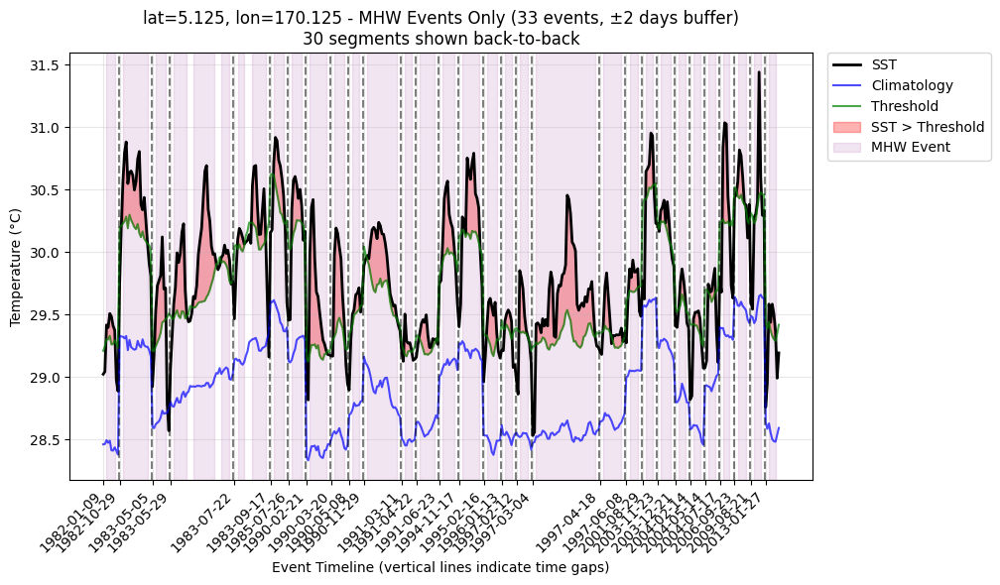

Trimmed to 589 days around 45 MHW events

Displaying 589 days around 45 MHW events:
------------------------------------------------------------
Segment 1: 1985-04-23 to 1985-05-05 (13 days)
Segment 2: 1985-05-22 to 1985-06-22 (32 days)
Segment 3: 1985-07-16 to 1985-07-26 (11 days)
Segment 4: 1985-08-23 to 1985-09-08 (17 days)
Segment 5: 1988-03-24 to 1988-04-02 (10 days)
Segment 6: 1988-07-06 to 1988-07-14 (9 days)
Segment 7: 1989-05-13 to 1989-05-25 (13 days)
Segment 8: 1989-07-28 to 1989-08-26 (30 days)
Segment 9: 1989-09-25 to 1989-10-12 (18 days)
Segment 10: 1990-02-13 to 1990-02-28 (16 days)
Segment 11: 1995-05-10 to 1995-05-22 (13 days)
Segment 12: 1995-07-14 to 1995-07-23 (10 days)
Segment 13: 1995-10-20 to 1995-10-28 (9 days)
Segment 14: 1995-11-03 to 1995-11-21 (19 days)
Segment 15: 1995-11-23 to 1995-12-11 (19 days)
Segment 16: 1995-12-27 to 1996-01-14 (19 days)
Segment 17: 1996-02-03 to 1996-02-19 (17 days)
Segment 18: 1996-04-07 to 1996-04-22 (16 days)
Segment 19: 1996-07-

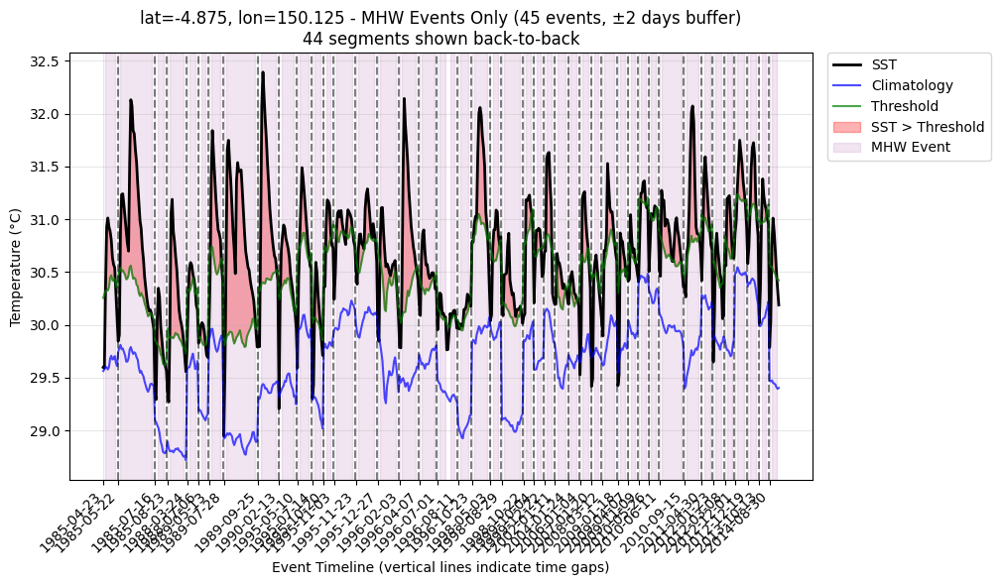

Trimmed to 692 days around 20 MHW events

Displaying 692 days around 20 MHW events:
------------------------------------------------------------
Segment 1: 1982-10-02 to 1982-10-15 (14 days)
Segment 2: 1982-10-18 to 1983-03-05 (139 days)
Segment 3: 1983-04-03 to 1983-06-20 (79 days)
Segment 4: 1983-06-22 to 1983-06-30 (9 days)
Segment 5: 1987-07-05 to 1987-07-13 (9 days)
Segment 6: 1987-09-01 to 1987-09-12 (12 days)
Segment 7: 1992-05-06 to 1992-05-14 (9 days)
Segment 8: 1994-10-14 to 1994-10-22 (9 days)
Segment 9: 1997-06-04 to 1997-06-13 (10 days)
Segment 10: 1997-06-20 to 1998-04-23 (308 days)
Segment 11: 1998-04-25 to 1998-05-14 (20 days)
Segment 12: 2006-11-30 to 2006-12-11 (12 days)
Segment 13: 2009-08-20 to 2009-08-29 (10 days)
Segment 14: 2009-12-17 to 2009-12-28 (12 days)
Segment 15: 2012-07-24 to 2012-08-04 (12 days)
Segment 16: 2014-06-13 to 2014-06-22 (10 days)
Segment 17: 2014-08-28 to 2014-09-05 (9 days)
Segment 18: 2014-12-10 to 2014-12-18 (9 days)

MHW Events in plot:
✓

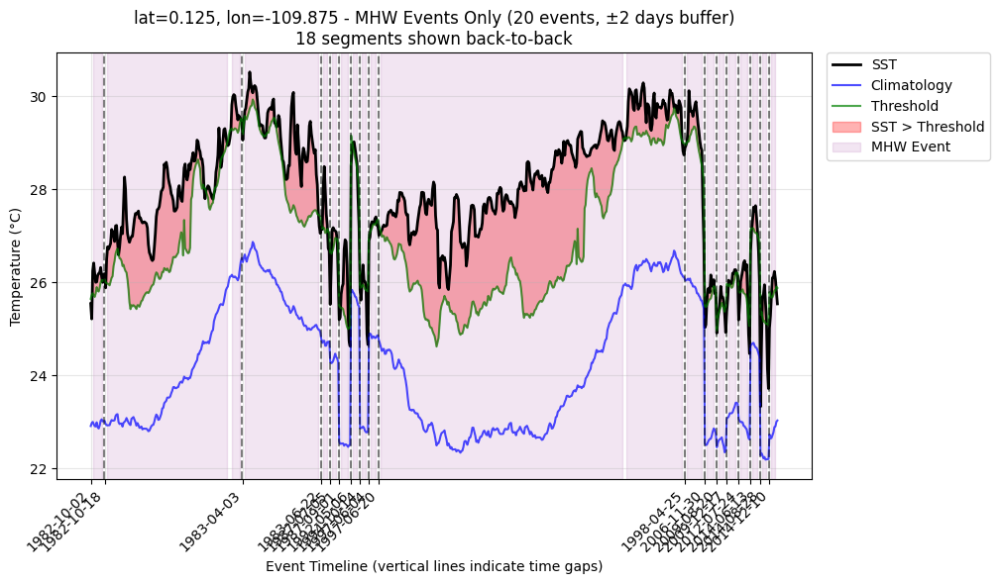

Trimmed to 553 days around 21 MHW events

Displaying 553 days around 21 MHW events:
------------------------------------------------------------
Segment 1: 1982-10-16 to 1982-10-25 (10 days)
Segment 2: 1982-10-30 to 1982-12-22 (54 days)
Segment 3: 1982-12-26 to 1983-01-17 (23 days)
Segment 4: 1983-02-19 to 1983-03-09 (19 days)
Segment 5: 1983-03-18 to 1983-03-28 (11 days)
Segment 6: 1983-05-24 to 1983-07-30 (68 days)
Segment 7: 1983-08-07 to 1983-08-19 (13 days)
Segment 8: 1987-06-25 to 1987-07-05 (11 days)
Segment 9: 1987-08-30 to 1987-09-18 (20 days)
Segment 10: 1987-09-24 to 1987-10-13 (20 days)
Segment 11: 1993-04-26 to 1993-05-07 (12 days)
Segment 12: 1993-05-27 to 1993-06-08 (13 days)
Segment 13: 1997-07-22 to 1997-10-03 (74 days)
Segment 14: 1997-10-14 to 1998-02-23 (133 days)
Segment 15: 1998-02-28 to 1998-04-02 (34 days)
Segment 16: 1998-05-01 to 1998-05-11 (11 days)
Segment 17: 2007-04-24 to 2007-05-02 (9 days)
Segment 18: 2010-03-28 to 2010-04-05 (9 days)
Segment 19: 2010-04

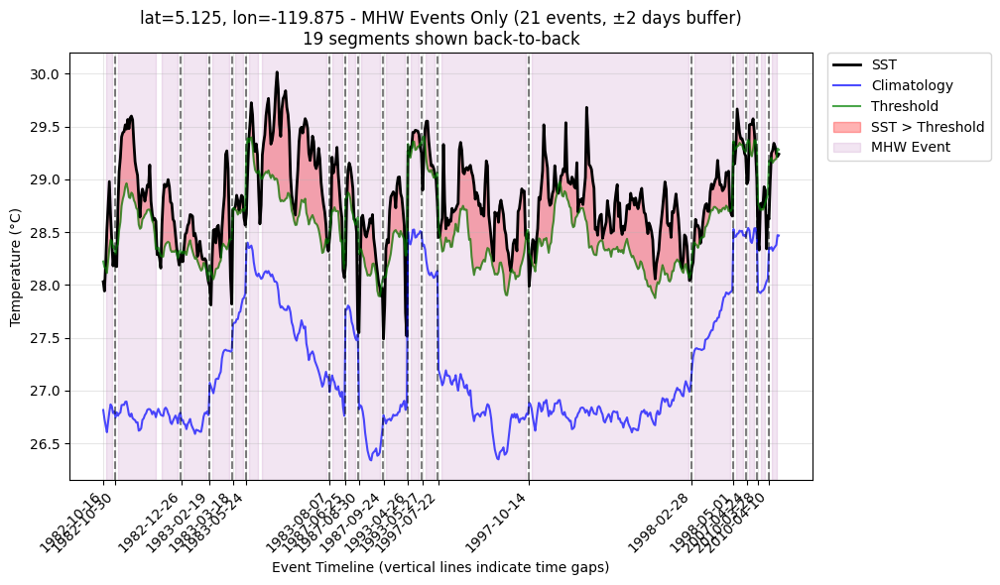

Trimmed to 597 days around 18 MHW events

Displaying 597 days around 18 MHW events:
------------------------------------------------------------
Segment 1: 1982-10-12 to 1982-10-30 (19 days)
Segment 2: 1982-11-02 to 1982-11-19 (18 days)
Segment 3: 1982-11-23 to 1982-12-02 (10 days)
Segment 4: 1982-12-11 to 1982-12-19 (9 days)
Segment 5: 1983-01-21 to 1983-02-10 (21 days)
Segment 6: 1983-02-15 to 1983-04-04 (49 days)
Segment 7: 1983-04-10 to 1983-08-30 (143 days)
Segment 8: 1983-09-08 to 1983-09-25 (18 days)
Segment 9: 1993-03-22 to 1993-03-30 (9 days)
Segment 10: 1997-06-28 to 1998-03-06 (252 days)
Segment 11: 1998-03-31 to 1998-04-13 (14 days)
Segment 12: 1998-05-05 to 1998-05-13 (9 days)
Segment 13: 1998-06-05 to 1998-06-15 (11 days)
Segment 14: 1998-06-17 to 1998-07-01 (15 days)

MHW Events in plot:
✓ Event 1: 1982-10-14 to 1982-10-28 (15 days)
✓ Event 2: 1982-11-04 to 1982-11-08 (5 days)
✓ Event 3: 1982-11-12 to 1982-11-17 (6 days)
✓ Event 4: 1982-11-25 to 1982-11-30 (6 days)
✓ Eve

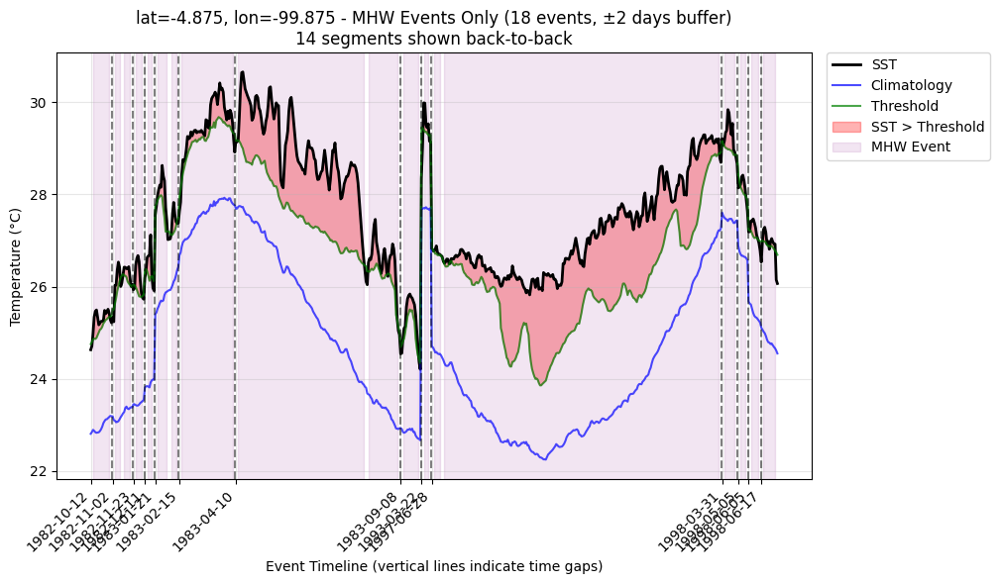

In [26]:
# ============================================
# OSTIA all points
# ============================================

print("PLOTTING ALL POINTS FOR OSTIA (TRIMMED VERSION)")
print("=" * 50)

# Get OSTIA data
data = model_data_mapping['OSTIA']

for point in points_of_interest:
    print(f"\nPlotting {point['name']} (lat={point['lat']}, lon={point['lon']})...")
    
    fig, events_data = plot_sst_trim_mhw_events(
        data['sst'],
        data['ssta'],
        data['thresholds'],
        data['mhw_events'],
        lat=point['lat'],
        lon=point['lon'],
        trim_to_events=True,
        buffer_days=2
    )
    plt.show()

PLOTTING ALL POINTS FOR OSTIA (TRIMMED VERSION)

Plotting Western_EQ_Pacific_1 (lat=0, lon=160)...
Trimmed to 470 days around 32 MHW events

Displaying 470 days around 32 MHW events:
------------------------------------------------------------
Segment 1: 1982-11-29 to 1982-12-15 (17 days)
Segment 2: 1982-12-18 to 1983-01-02 (16 days)
Segment 3: 1983-01-23 to 1983-02-10 (19 days)
Segment 4: 1983-02-16 to 1983-03-01 (14 days)
Segment 5: 1983-05-03 to 1983-05-11 (9 days)
Segment 6: 1984-09-12 to 1984-09-27 (16 days)
Segment 7: 1984-10-05 to 1984-10-30 (26 days)
Segment 8: 1984-11-09 to 1984-11-22 (14 days)
Segment 9: 1985-02-16 to 1985-02-24 (9 days)
Segment 10: 1985-09-23 to 1985-10-02 (10 days)
Segment 11: 1985-10-24 to 1985-11-07 (15 days)
Segment 12: 1985-12-10 to 1985-12-18 (9 days)
Segment 13: 1985-12-29 to 1986-01-22 (25 days)
Segment 14: 1986-06-20 to 1986-07-01 (12 days)
Segment 15: 1999-04-19 to 1999-05-04 (16 days)
Segment 16: 1999-08-29 to 1999-09-11 (14 days)
Segment 17: 2001

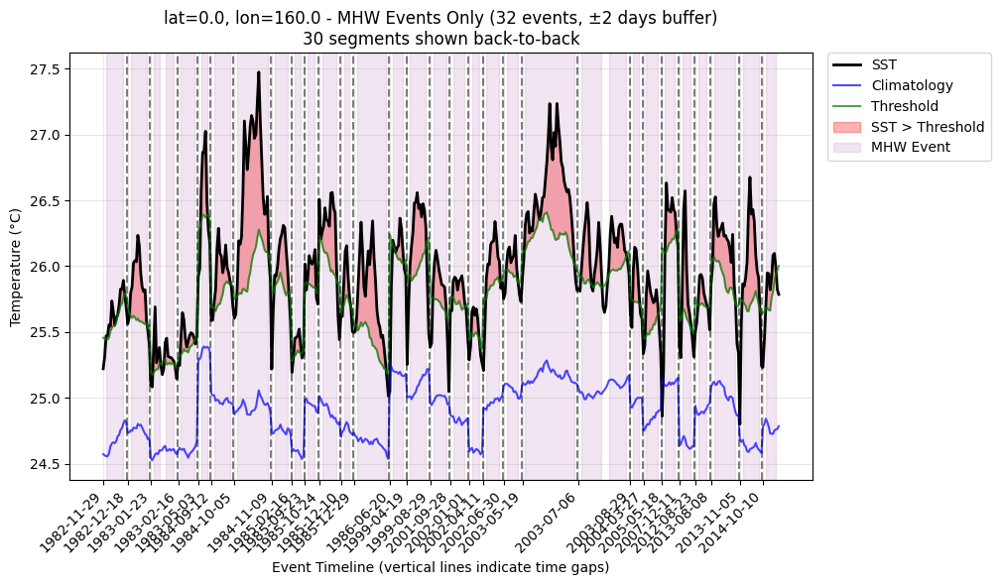


Plotting Western_EQ_Pacific_2 (lat=5, lon=170)...


Task exception was never retrieved
future: <Task finished name='Task-3284249' coro=<Client._gather.<locals>.wait() done, defined at /home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:2394> exception=AllExit()>
Traceback (most recent call last):
  File "/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py", line 2403, in wait
    raise AllExit()
distributed.client.AllExit
Task exception was never retrieved
future: <Task finished name='Task-3284250' coro=<Client._gather.<locals>.wait() done, defined at /home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:2394> exception=AllExit()>
Traceback (most recent call last):
  File "/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py", line 2403, in wait
    raise AllExit()
distributed.client.AllExit
Task exception was never retrieved
future: <Task finished name='Task-3284251' coro=<Client._gather.<locals>.wait() done, defined at /home/b/b382616/.local/lib/pytho

Trimmed to 475 days around 35 MHW events

Displaying 475 days around 35 MHW events:
------------------------------------------------------------
Segment 1: 1982-12-17 to 1982-12-25 (9 days)
Segment 2: 1983-11-04 to 1983-11-12 (9 days)
Segment 3: 1984-09-04 to 1984-09-17 (14 days)
Segment 4: 1984-09-22 to 1984-10-12 (21 days)
Segment 5: 1984-12-01 to 1984-12-10 (10 days)
Segment 6: 1985-07-31 to 1985-08-18 (19 days)
Segment 7: 1985-08-24 to 1985-09-16 (24 days)
Segment 8: 1985-09-21 to 1985-10-05 (15 days)
Segment 9: 1985-11-06 to 1985-12-07 (32 days)
Segment 10: 1986-05-06 to 1986-05-24 (19 days)
Segment 11: 1986-05-27 to 1986-07-08 (43 days)
Segment 12: 1986-07-12 to 1986-08-06 (26 days)
Segment 13: 1986-08-12 to 1986-08-28 (17 days)
Segment 14: 1987-01-29 to 1987-02-07 (10 days)
Segment 15: 1997-11-14 to 1997-11-28 (15 days)
Segment 16: 1998-01-11 to 1998-01-22 (12 days)
Segment 17: 1998-10-20 to 1998-11-02 (14 days)
Segment 18: 1998-12-06 to 1998-12-18 (13 days)
Segment 19: 1999-01-

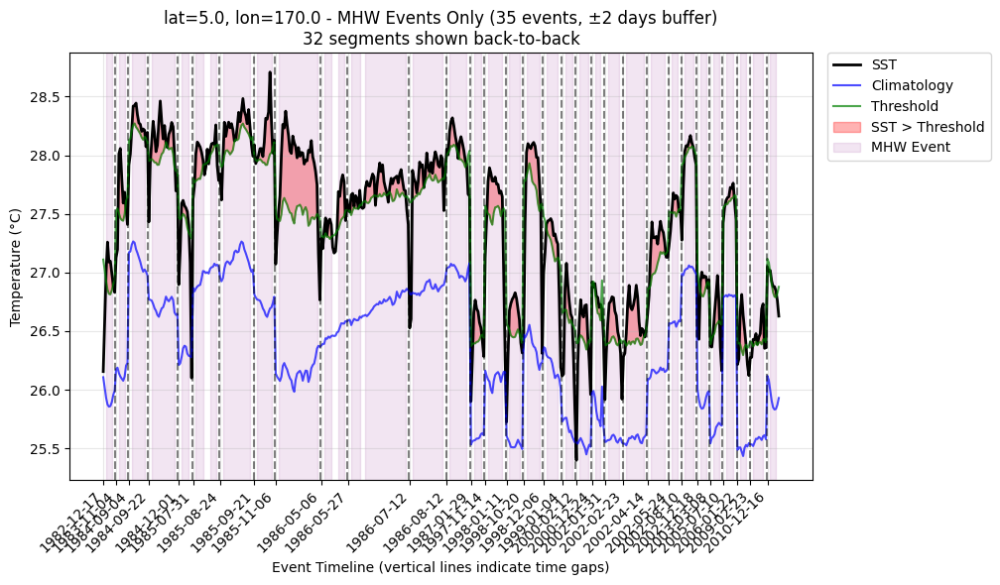


Plotting Western_EQ_Pacific_3 (lat=-5, lon=150)...
Trimmed to 314 days around 22 MHW events

Displaying 314 days around 22 MHW events:
------------------------------------------------------------
Segment 1: 1983-03-03 to 1983-03-31 (29 days)
Segment 2: 1985-11-20 to 1985-12-21 (32 days)
Segment 3: 1986-01-13 to 1986-01-26 (14 days)
Segment 4: 1986-02-14 to 1986-02-28 (15 days)
Segment 5: 1987-05-27 to 1987-06-05 (10 days)
Segment 6: 1997-10-17 to 1997-10-27 (11 days)
Segment 7: 2001-07-27 to 2001-08-21 (26 days)
Segment 8: 2001-09-03 to 2001-09-15 (13 days)
Segment 9: 2001-09-17 to 2001-09-30 (14 days)
Segment 10: 2003-10-06 to 2003-10-28 (23 days)
Segment 11: 2004-02-09 to 2004-02-18 (10 days)
Segment 12: 2004-05-16 to 2004-05-24 (9 days)
Segment 13: 2004-06-04 to 2004-06-19 (16 days)
Segment 14: 2004-06-29 to 2004-07-10 (12 days)
Segment 15: 2011-02-27 to 2011-03-09 (11 days)
Segment 16: 2013-10-03 to 2013-10-13 (11 days)
Segment 17: 2014-05-04 to 2014-05-12 (9 days)
Segment 18: 201

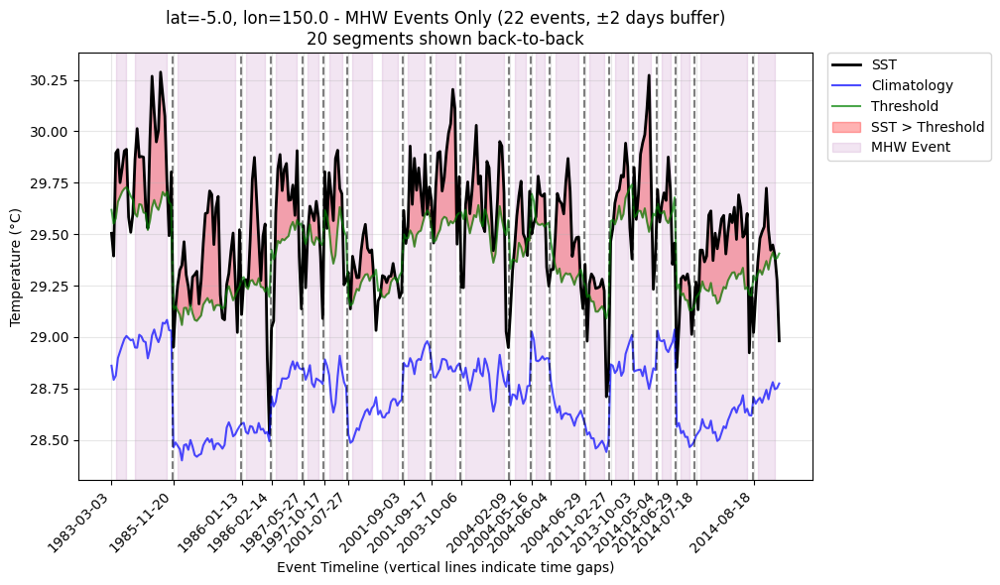


Plotting Eastern_EQ_Pacific_1 (lat=0, lon=-110)...
Trimmed to 490 days around 38 MHW events

Displaying 490 days around 38 MHW events:
------------------------------------------------------------
Segment 1: 1982-03-14 to 1982-03-26 (13 days)
Segment 2: 1982-04-10 to 1982-04-27 (18 days)
Segment 3: 1982-10-05 to 1982-10-16 (12 days)
Segment 4: 1983-01-25 to 1983-02-09 (16 days)
Segment 5: 1984-01-19 to 1984-01-28 (10 days)
Segment 6: 1985-06-02 to 1985-07-11 (40 days)
Segment 7: 1989-07-03 to 1989-07-11 (9 days)
Segment 8: 1989-09-19 to 1989-09-28 (10 days)
Segment 9: 1995-08-23 to 1995-09-02 (11 days)
Segment 10: 1995-09-30 to 1995-10-09 (10 days)
Segment 11: 1995-10-31 to 1995-11-08 (9 days)
Segment 12: 1996-01-15 to 1996-01-23 (9 days)
Segment 13: 1996-11-06 to 1996-11-14 (9 days)
Segment 14: 1997-03-06 to 1997-03-20 (15 days)
Segment 15: 1997-05-01 to 1997-05-12 (12 days)
Segment 16: 1997-08-02 to 1997-08-13 (12 days)
Segment 17: 1998-07-21 to 1998-07-29 (9 days)
Segment 18: 1999-0

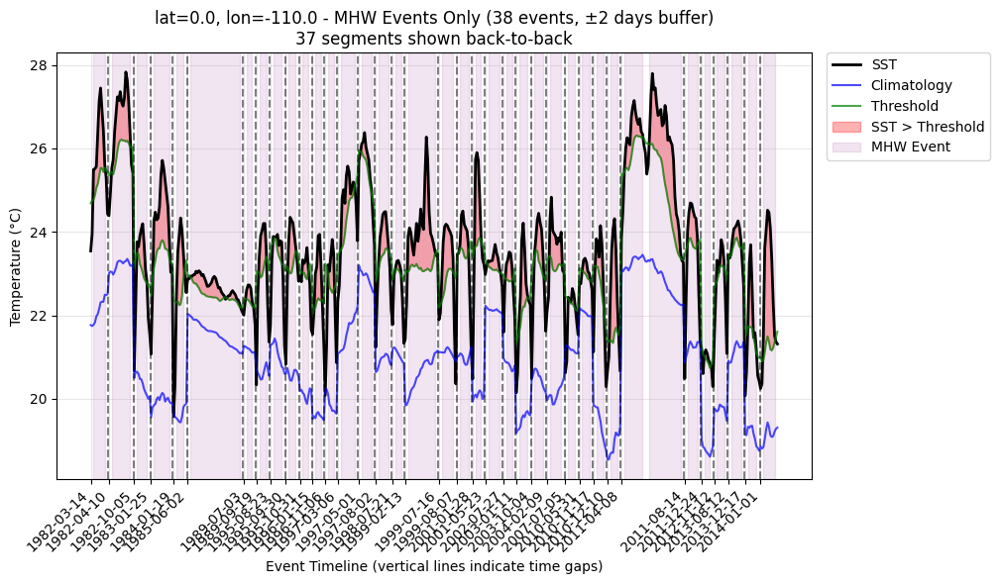


Plotting Eastern_EQ_Pacific_2 (lat=5, lon=-120)...
Trimmed to 585 days around 36 MHW events

Displaying 585 days around 36 MHW events:
------------------------------------------------------------
Segment 1: 1982-06-07 to 1982-06-27 (21 days)
Segment 2: 1982-07-05 to 1982-07-16 (12 days)
Segment 3: 1982-08-01 to 1982-08-11 (11 days)
Segment 4: 1984-09-20 to 1984-10-13 (24 days)
Segment 5: 1984-10-15 to 1984-11-04 (21 days)
Segment 6: 1985-01-13 to 1985-01-24 (12 days)
Segment 7: 1985-03-13 to 1985-03-21 (9 days)
Segment 8: 1985-03-29 to 1985-04-19 (22 days)
Segment 9: 1985-06-23 to 1985-07-04 (12 days)
Segment 10: 1985-07-29 to 1985-08-15 (18 days)
Segment 11: 1985-09-16 to 1985-09-25 (10 days)
Segment 12: 1985-10-01 to 1985-10-11 (11 days)
Segment 13: 1985-11-08 to 1985-11-21 (14 days)
Segment 14: 1985-11-23 to 1985-12-11 (19 days)
Segment 15: 1985-12-17 to 1985-12-29 (13 days)
Segment 16: 1986-01-29 to 1986-02-13 (16 days)
Segment 17: 1987-01-14 to 1987-01-29 (16 days)
Segment 18: 19

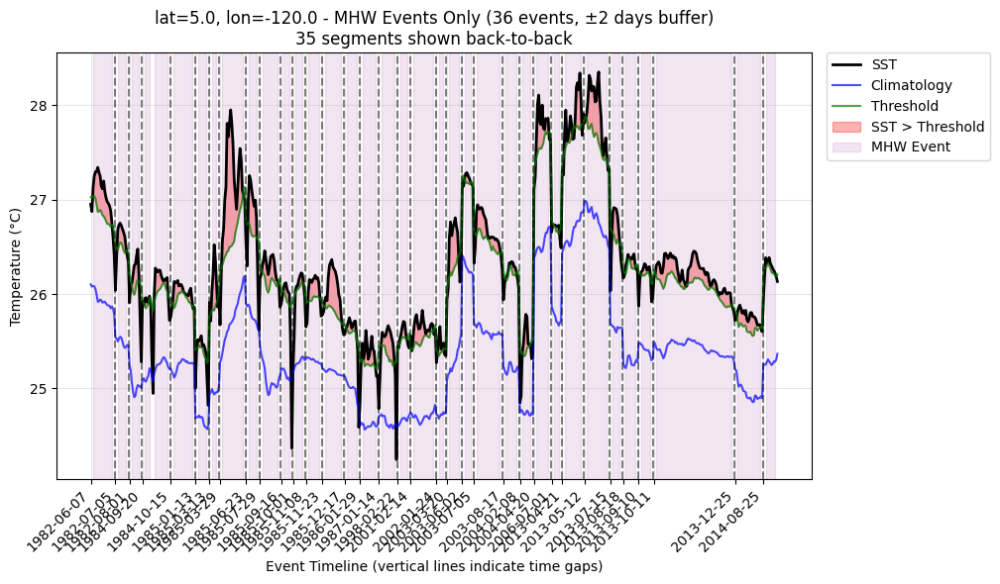


Plotting Eastern_EQ_Pacific_3 (lat=-5, lon=-100)...
Trimmed to 489 days around 30 MHW events

Displaying 489 days around 30 MHW events:
------------------------------------------------------------
Segment 1: 1982-05-08 to 1982-06-12 (36 days)
Segment 2: 1982-10-12 to 1982-10-23 (12 days)
Segment 3: 1984-04-20 to 1984-04-29 (10 days)
Segment 4: 1984-05-16 to 1984-05-24 (9 days)
Segment 5: 1984-08-17 to 1984-08-31 (15 days)
Segment 6: 1985-06-13 to 1985-06-29 (17 days)
Segment 7: 1985-07-09 to 1985-07-18 (10 days)
Segment 8: 1985-07-30 to 1985-08-30 (32 days)
Segment 9: 1985-09-10 to 1985-09-25 (16 days)
Segment 10: 1985-09-27 to 1985-10-09 (13 days)
Segment 11: 1988-06-05 to 1988-06-13 (9 days)
Segment 12: 1989-07-19 to 1989-07-29 (11 days)
Segment 13: 1992-06-11 to 1992-07-01 (21 days)
Segment 14: 1995-11-14 to 1995-12-05 (22 days)
Segment 15: 1998-01-11 to 1998-01-19 (9 days)
Segment 16: 1999-10-27 to 1999-11-06 (11 days)
Segment 17: 2001-08-26 to 2001-09-23 (29 days)
Segment 18: 200

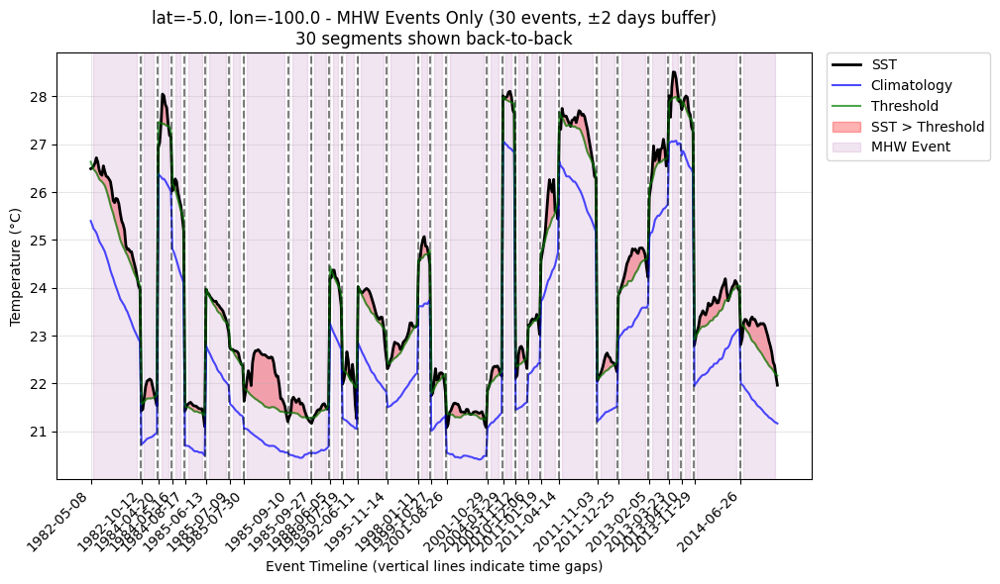

In [30]:
# ============================================
# ICON all points
# ============================================

print("PLOTTING ALL POINTS FOR ICON (TRIMMED VERSION)")
print("=" * 50)

# Get OSTIA data
data = model_data_mapping['ICON']

for point in points_of_interest:
    print(f"\nPlotting {point['name']} (lat={point['lat']}, lon={point['lon']})...")
    
    fig, events_data = plot_sst_trim_mhw_events(
        data['sst'],
        data['ssta'],
        data['thresholds'],
        data['mhw_events'],
        lat=point['lat'],
        lon=point['lon'],
        trim_to_events=True,
        buffer_days=2
    )
    plt.show()

In [17]:
# ============================================
# IFS-FESOM all points
# ============================================

print("PLOTTING ALL POINTS FOR IFS-FESOM (TRIMMED VERSION)")
print("=" * 50)

# Get OSTIA data
data = model_data_mapping['IFS-FESOM']

for point in points_of_interest:
    print(f"\nPlotting {point['name']} (lat={point['lat']}, lon={point['lon']})...")
    
    fig, events_data = plot_sst_trim_mhw_events(
        data['sst'],
        data['ssta'],
        data['thresholds'],
        data['mhw_events'],
        lat=point['lat'],
        lon=point['lon'],
        trim_to_events=True,
        buffer_days=2
    )
    plt.show()

PLOTTING ALL POINTS FOR IFS-FESOM (TRIMMED VERSION)

Plotting Western_EQ_Pacific_1 (lat=0, lon=160)...
Trimmed to 578 days around 36 MHW events


TypeError: Cannot compare dtypes datetime64[ns] and int64

PLOTTING ALL POINTS WITH MODEL COMPARISONS

POINT: Western_EQ_Pacific_1 (lat=0, lon=160)
Trimmed to 430 days around 34 MHW events

Displaying 430 days around 34 MHW events:
------------------------------------------------------------
Segment 1: 1983-07-18 to 1983-08-02 (16 days)
Segment 2: 1985-08-19 to 1985-09-09 (22 days)
Segment 3: 1986-02-22 to 1986-03-02 (9 days)
Segment 4: 1990-01-01 to 1990-01-09 (9 days)
Segment 5: 1990-02-26 to 1990-03-06 (9 days)
Segment 6: 1990-03-26 to 1990-04-04 (10 days)
Segment 7: 1990-05-27 to 1990-06-15 (20 days)
Segment 8: 1990-07-14 to 1990-07-23 (10 days)
Segment 9: 1990-09-26 to 1990-10-14 (19 days)
Segment 10: 1990-10-31 to 1990-11-12 (13 days)
Segment 11: 1991-03-05 to 1991-03-19 (15 days)
Segment 12: 1991-04-05 to 1991-04-20 (16 days)
Segment 13: 1991-06-11 to 1991-06-19 (9 days)
Segment 14: 1994-11-23 to 1994-12-04 (12 days)
Segment 15: 1995-02-01 to 1995-02-10 (10 days)
Segment 16: 1995-03-17 to 1995-03-25 (9 days)
Segment 17: 1995-05-12 to 19

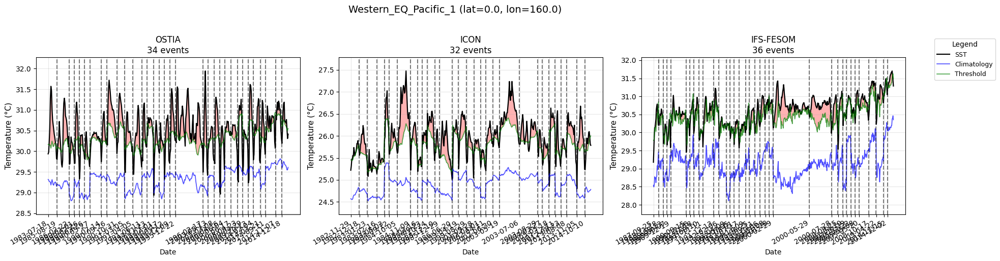


POINT: Western_EQ_Pacific_2 (lat=5, lon=170)
Trimmed to 413 days around 33 MHW events

Displaying 413 days around 33 MHW events:
------------------------------------------------------------
Segment 1: 1982-01-09 to 1982-01-18 (10 days)
Segment 2: 1982-10-29 to 1982-11-17 (20 days)
Segment 3: 1983-05-05 to 1983-05-15 (11 days)
Segment 4: 1983-05-29 to 1983-07-06 (39 days)
Segment 5: 1983-07-22 to 1983-08-12 (22 days)
Segment 6: 1983-09-17 to 1983-09-27 (11 days)
Segment 7: 1985-07-26 to 1985-08-05 (11 days)
Segment 8: 1990-02-21 to 1990-03-07 (15 days)
Segment 9: 1990-03-20 to 1990-03-30 (11 days)
Segment 10: 1990-05-08 to 1990-05-16 (9 days)
Segment 11: 1990-11-29 to 1990-12-21 (23 days)
Segment 12: 1991-03-11 to 1991-03-19 (9 days)
Segment 13: 1991-04-22 to 1991-05-05 (14 days)
Segment 14: 1991-06-23 to 1991-07-04 (12 days)
Segment 15: 1994-11-17 to 1994-12-01 (15 days)
Segment 16: 1995-02-16 to 1995-02-26 (11 days)
Segment 17: 1996-01-13 to 1996-01-21 (9 days)
Segment 18: 1997-02-12

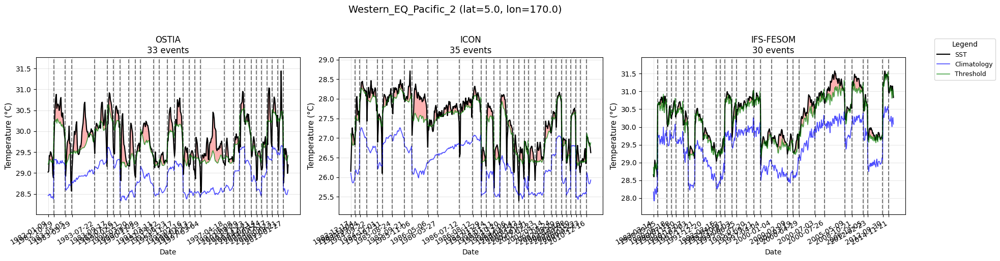


POINT: Western_EQ_Pacific_3 (lat=-5, lon=150)
Trimmed to 589 days around 45 MHW events

Displaying 589 days around 45 MHW events:
------------------------------------------------------------
Segment 1: 1985-04-23 to 1985-05-05 (13 days)
Segment 2: 1985-05-22 to 1985-06-22 (32 days)
Segment 3: 1985-07-16 to 1985-07-26 (11 days)
Segment 4: 1985-08-23 to 1985-09-08 (17 days)
Segment 5: 1988-03-24 to 1988-04-02 (10 days)
Segment 6: 1988-07-06 to 1988-07-14 (9 days)
Segment 7: 1989-05-13 to 1989-05-25 (13 days)
Segment 8: 1989-07-28 to 1989-08-26 (30 days)
Segment 9: 1989-09-25 to 1989-10-12 (18 days)
Segment 10: 1990-02-13 to 1990-02-28 (16 days)
Segment 11: 1995-05-10 to 1995-05-22 (13 days)
Segment 12: 1995-07-14 to 1995-07-23 (10 days)
Segment 13: 1995-10-20 to 1995-10-28 (9 days)
Segment 14: 1995-11-03 to 1995-11-21 (19 days)
Segment 15: 1995-11-23 to 1995-12-11 (19 days)
Segment 16: 1995-12-27 to 1996-01-14 (19 days)
Segment 17: 1996-02-03 to 1996-02-19 (17 days)
Segment 18: 1996-04-

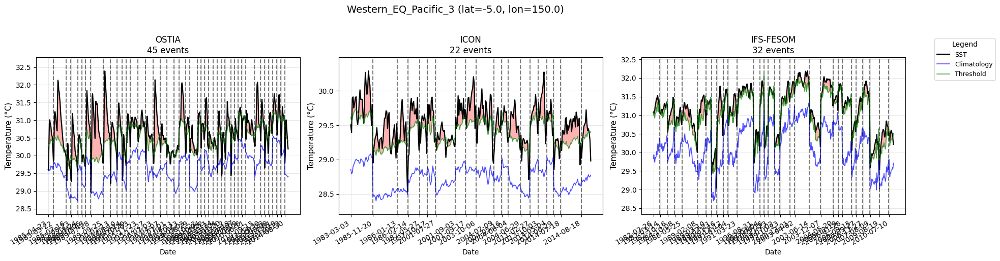


POINT: Eastern_EQ_Pacific_1 (lat=0, lon=-110)
Trimmed to 692 days around 20 MHW events

Displaying 692 days around 20 MHW events:
------------------------------------------------------------
Segment 1: 1982-10-02 to 1982-10-15 (14 days)
Segment 2: 1982-10-18 to 1983-03-05 (139 days)
Segment 3: 1983-04-03 to 1983-06-20 (79 days)
Segment 4: 1983-06-22 to 1983-06-30 (9 days)
Segment 5: 1987-07-05 to 1987-07-13 (9 days)
Segment 6: 1987-09-01 to 1987-09-12 (12 days)
Segment 7: 1992-05-06 to 1992-05-14 (9 days)
Segment 8: 1994-10-14 to 1994-10-22 (9 days)
Segment 9: 1997-06-04 to 1997-06-13 (10 days)
Segment 10: 1997-06-20 to 1998-04-23 (308 days)
Segment 11: 1998-04-25 to 1998-05-14 (20 days)
Segment 12: 2006-11-30 to 2006-12-11 (12 days)
Segment 13: 2009-08-20 to 2009-08-29 (10 days)
Segment 14: 2009-12-17 to 2009-12-28 (12 days)
Segment 15: 2012-07-24 to 2012-08-04 (12 days)
Segment 16: 2014-06-13 to 2014-06-22 (10 days)
Segment 17: 2014-08-28 to 2014-09-05 (9 days)
Segment 18: 2014-12-1

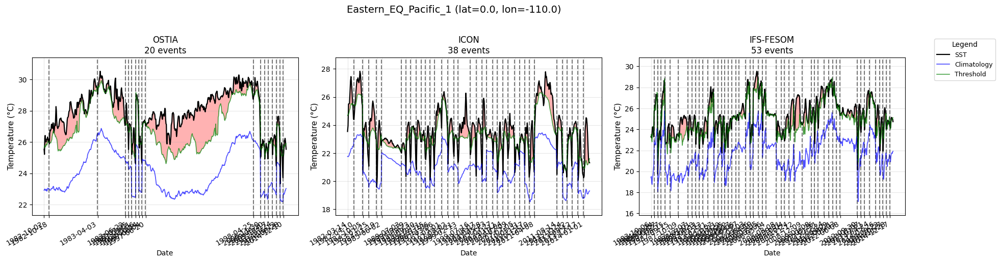


POINT: Eastern_EQ_Pacific_2 (lat=5, lon=-120)
Trimmed to 553 days around 21 MHW events

Displaying 553 days around 21 MHW events:
------------------------------------------------------------
Segment 1: 1982-10-16 to 1982-10-25 (10 days)
Segment 2: 1982-10-30 to 1982-12-22 (54 days)
Segment 3: 1982-12-26 to 1983-01-17 (23 days)
Segment 4: 1983-02-19 to 1983-03-09 (19 days)
Segment 5: 1983-03-18 to 1983-03-28 (11 days)
Segment 6: 1983-05-24 to 1983-07-30 (68 days)
Segment 7: 1983-08-07 to 1983-08-19 (13 days)
Segment 8: 1987-06-25 to 1987-07-05 (11 days)
Segment 9: 1987-08-30 to 1987-09-18 (20 days)
Segment 10: 1987-09-24 to 1987-10-13 (20 days)
Segment 11: 1993-04-26 to 1993-05-07 (12 days)
Segment 12: 1993-05-27 to 1993-06-08 (13 days)
Segment 13: 1997-07-22 to 1997-10-03 (74 days)
Segment 14: 1997-10-14 to 1998-02-23 (133 days)
Segment 15: 1998-02-28 to 1998-04-02 (34 days)
Segment 16: 1998-05-01 to 1998-05-11 (11 days)
Segment 17: 2007-04-24 to 2007-05-02 (9 days)
Segment 18: 2010-0

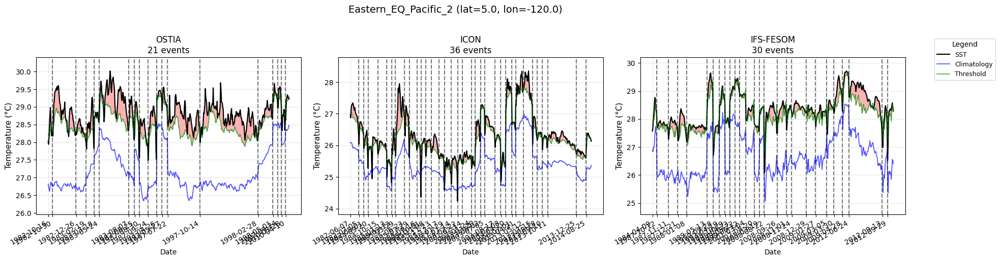


POINT: Eastern_EQ_Pacific_3 (lat=-5, lon=-100)
Trimmed to 597 days around 18 MHW events

Displaying 597 days around 18 MHW events:
------------------------------------------------------------
Segment 1: 1982-10-12 to 1982-10-30 (19 days)
Segment 2: 1982-11-02 to 1982-11-19 (18 days)
Segment 3: 1982-11-23 to 1982-12-02 (10 days)
Segment 4: 1982-12-11 to 1982-12-19 (9 days)
Segment 5: 1983-01-21 to 1983-02-10 (21 days)
Segment 6: 1983-02-15 to 1983-04-04 (49 days)
Segment 7: 1983-04-10 to 1983-08-30 (143 days)
Segment 8: 1983-09-08 to 1983-09-25 (18 days)
Segment 9: 1993-03-22 to 1993-03-30 (9 days)
Segment 10: 1997-06-28 to 1998-03-06 (252 days)
Segment 11: 1998-03-31 to 1998-04-13 (14 days)
Segment 12: 1998-05-05 to 1998-05-13 (9 days)
Segment 13: 1998-06-05 to 1998-06-15 (11 days)
Segment 14: 1998-06-17 to 1998-07-01 (15 days)

MHW Events in plot:
✓ Event 1: 1982-10-14 to 1982-10-28 (15 days)
✓ Event 2: 1982-11-04 to 1982-11-08 (5 days)
✓ Event 3: 1982-11-12 to 1982-11-17 (6 days)
✓ 

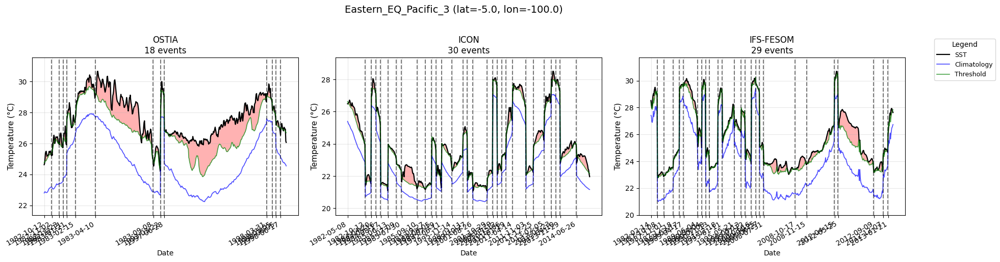


POINT: Atlantic_Equatorial (lat=0, lon=-30)
Trimmed to 510 days around 43 MHW events

Displaying 510 days around 43 MHW events:
------------------------------------------------------------
Segment 1: 1983-04-08 to 1983-04-16 (9 days)
Segment 2: 1983-07-24 to 1983-08-01 (9 days)
Segment 3: 1985-07-01 to 1985-07-10 (10 days)
Segment 4: 1988-01-18 to 1988-02-03 (17 days)
Segment 5: 1989-01-04 to 1989-01-14 (11 days)
Segment 6: 1989-03-17 to 1989-03-29 (13 days)
Segment 7: 1989-05-11 to 1989-05-19 (9 days)
Segment 8: 1991-05-21 to 1991-06-03 (14 days)
Segment 9: 1993-09-09 to 1993-09-19 (11 days)
Segment 10: 1994-05-10 to 1994-05-18 (9 days)
Segment 11: 1995-02-22 to 1995-03-06 (13 days)
Segment 12: 1995-10-02 to 1995-10-12 (11 days)
Segment 13: 1995-10-28 to 1995-11-06 (10 days)
Segment 14: 1995-12-02 to 1995-12-14 (13 days)
Segment 15: 1996-02-13 to 1996-02-21 (9 days)
Segment 16: 1996-02-29 to 1996-03-10 (11 days)
Segment 17: 1996-06-09 to 1996-06-21 (13 days)
Segment 18: 1998-03-09 to

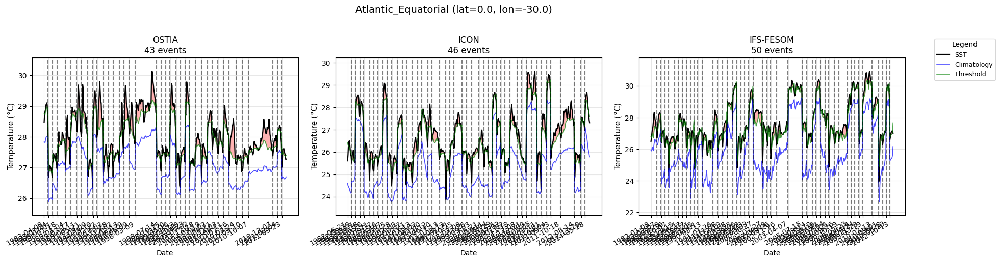


POINT: Indian_Equatorial (lat=0, lon=60)
Trimmed to 355 days around 25 MHW events

Displaying 355 days around 25 MHW events:
------------------------------------------------------------
Segment 1: 1982-11-01 to 1982-11-25 (25 days)
Segment 2: 1983-04-06 to 1983-04-17 (12 days)
Segment 3: 1983-05-30 to 1983-06-21 (23 days)
Segment 4: 1983-06-23 to 1983-09-04 (74 days)
Segment 5: 1983-09-14 to 1983-09-27 (14 days)
Segment 6: 1987-09-25 to 1987-10-05 (11 days)
Segment 7: 1988-09-03 to 1988-09-12 (10 days)
Segment 8: 1988-12-01 to 1988-12-12 (12 days)
Segment 9: 1989-03-22 to 1989-03-30 (9 days)
Segment 10: 1989-05-01 to 1989-05-09 (9 days)
Segment 11: 1994-03-06 to 1994-03-15 (10 days)
Segment 12: 1995-01-07 to 1995-01-15 (9 days)
Segment 13: 1997-10-20 to 1997-10-28 (9 days)
Segment 14: 1997-12-23 to 1998-01-10 (19 days)
Segment 15: 1998-01-13 to 1998-01-22 (10 days)
Segment 16: 1999-02-21 to 1999-03-07 (15 days)
Segment 17: 2000-04-29 to 2000-05-08 (10 days)
Segment 18: 2001-02-07 to 2

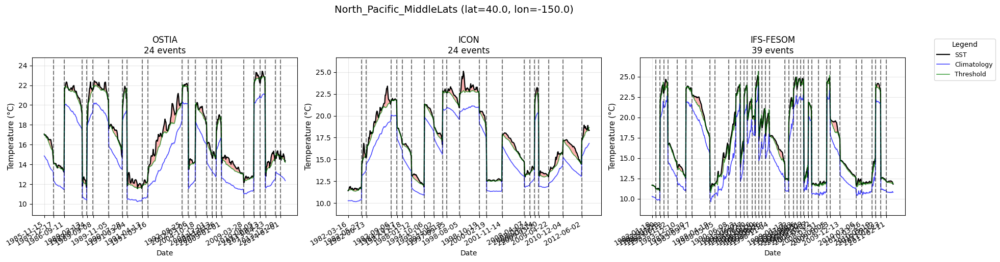


POINT: South_Pacific_SubTropics (lat=-20, lon=-150)
Trimmed to 462 days around 33 MHW events

Displaying 462 days around 33 MHW events:
------------------------------------------------------------
Segment 1: 1982-04-25 to 1982-05-04 (10 days)
Segment 2: 1982-08-13 to 1982-08-23 (11 days)
Segment 3: 1983-06-23 to 1983-07-01 (9 days)
Segment 4: 1983-07-18 to 1983-07-26 (9 days)
Segment 5: 1986-07-18 to 1986-07-27 (10 days)
Segment 6: 1987-05-11 to 1987-05-31 (21 days)
Segment 7: 1988-04-21 to 1988-04-29 (9 days)
Segment 8: 1988-12-05 to 1988-12-24 (20 days)
Segment 9: 1989-01-15 to 1989-01-23 (9 days)
Segment 10: 1989-08-30 to 1989-09-08 (10 days)
Segment 11: 1992-08-30 to 1992-09-10 (12 days)
Segment 12: 1993-08-18 to 1993-08-28 (11 days)
Segment 13: 1994-02-12 to 1994-02-20 (9 days)
Segment 14: 1994-02-25 to 1994-03-20 (24 days)
Segment 15: 1994-03-26 to 1994-04-04 (10 days)
Segment 16: 1995-04-14 to 1995-04-25 (12 days)
Segment 17: 1999-02-02 to 1999-02-13 (12 days)
Segment 18: 1999-

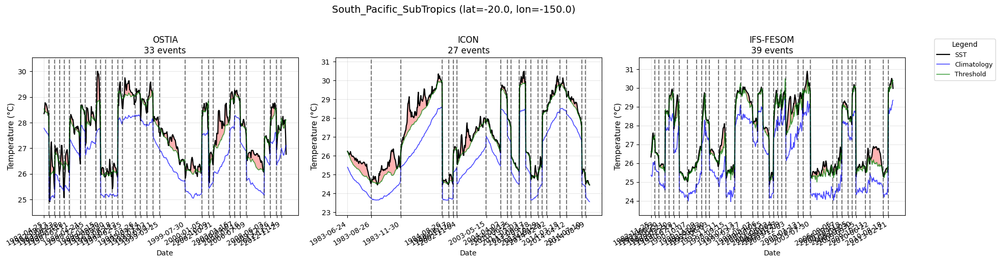


POINT: North_Atlantic_SubTropics (lat=20, lon=-40)
Trimmed to 503 days around 24 MHW events

Displaying 588 days around 34 MHW events:
------------------------------------------------------------
Segment 1: 1983-05-07 to 1983-05-15 (9 days)
Segment 2: 1986-08-19 to 1986-08-27 (9 days)
Segment 3: 1987-06-02 to 1987-06-13 (12 days)
Segment 4: 1987-07-06 to 1987-07-14 (9 days)
Segment 5: 1987-11-02 to 1987-11-10 (9 days)
Segment 6: 1987-12-11 to 1987-12-20 (10 days)
Segment 7: 1988-03-11 to 1988-04-12 (33 days)
Segment 8: 1989-01-19 to 1989-01-29 (11 days)
Segment 9: 1990-05-12 to 1990-05-22 (11 days)
Segment 10: 1990-08-03 to 1990-08-13 (11 days)
Segment 11: 1991-04-02 to 1991-04-10 (9 days)
Segment 12: 1993-09-08 to 1993-09-25 (18 days)
Segment 13: 1993-10-05 to 1993-11-01 (28 days)
Segment 14: 1997-09-22 to 1997-09-30 (9 days)
Segment 15: 1997-10-14 to 1997-10-31 (18 days)
Segment 16: 1997-11-12 to 1997-11-24 (13 days)
Segment 17: 1997-11-27 to 1997-12-13 (17 days)
Segment 18: 1998-06

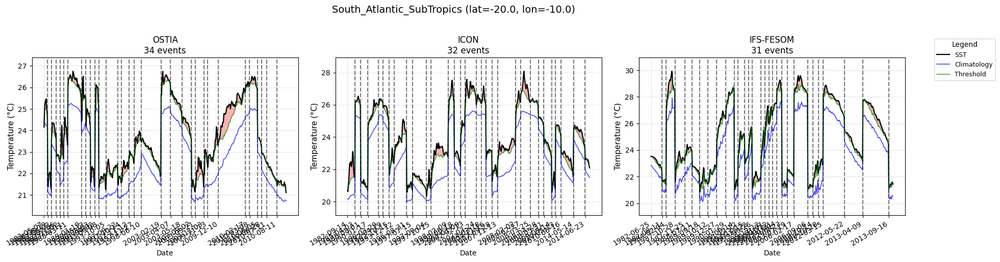


POINT: Indian_NorthSubTropics (lat=20, lon=60)
Trimmed to 465 days around 38 MHW events

Displaying 465 days around 38 MHW events:
------------------------------------------------------------
Segment 1: 1982-10-26 to 1982-11-07 (13 days)
Segment 2: 1986-06-04 to 1986-06-14 (11 days)
Segment 3: 1987-09-15 to 1987-09-23 (9 days)
Segment 4: 1987-10-07 to 1987-10-15 (9 days)
Segment 5: 1988-12-31 to 1989-01-19 (20 days)
Segment 6: 1989-11-12 to 1989-11-27 (16 days)
Segment 7: 1990-01-17 to 1990-02-06 (21 days)
Segment 8: 1991-02-01 to 1991-02-10 (10 days)
Segment 9: 1993-01-06 to 1993-01-16 (11 days)
Segment 10: 1993-02-16 to 1993-02-27 (12 days)
Segment 11: 1993-06-05 to 1993-06-13 (9 days)
Segment 12: 1993-07-29 to 1993-08-11 (14 days)
Segment 13: 1993-08-15 to 1993-09-03 (20 days)
Segment 14: 1994-03-10 to 1994-03-30 (21 days)
Segment 15: 1994-07-09 to 1994-07-17 (9 days)
Segment 16: 1996-03-07 to 1996-03-16 (10 days)
Segment 17: 1998-03-26 to 1998-04-17 (23 days)
Segment 18: 1998-04-2

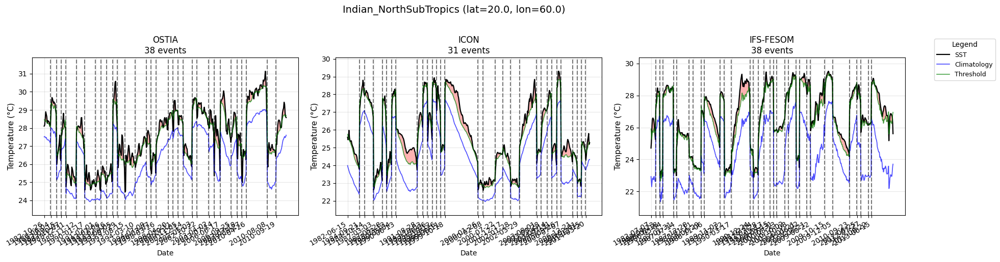


POINT: Indian_SouthSubTropics (lat=-20, lon=60)
Trimmed to 571 days around 42 MHW events

Displaying 571 days around 42 MHW events:
------------------------------------------------------------
Segment 1: 1982-09-05 to 1982-10-03 (29 days)
Segment 2: 1982-11-06 to 1982-11-14 (9 days)
Segment 3: 1983-04-15 to 1983-05-02 (18 days)
Segment 4: 1983-06-08 to 1983-07-12 (35 days)
Segment 5: 1983-07-15 to 1983-08-01 (18 days)
Segment 6: 1983-08-12 to 1983-08-21 (10 days)
Segment 7: 1987-03-13 to 1987-05-09 (58 days)
Segment 8: 1987-05-13 to 1987-05-21 (9 days)
Segment 9: 1987-07-06 to 1987-07-16 (11 days)
Segment 10: 1987-09-15 to 1987-09-24 (10 days)
Segment 11: 1988-02-29 to 1988-03-17 (18 days)
Segment 12: 1991-10-27 to 1991-11-05 (10 days)
Segment 13: 1992-01-25 to 1992-02-12 (19 days)
Segment 14: 1993-06-21 to 1993-07-02 (12 days)
Segment 15: 1995-07-26 to 1995-08-06 (12 days)
Segment 16: 1997-11-11 to 1997-11-20 (10 days)
Segment 17: 1997-11-25 to 1997-12-05 (11 days)
Segment 18: 1998-0

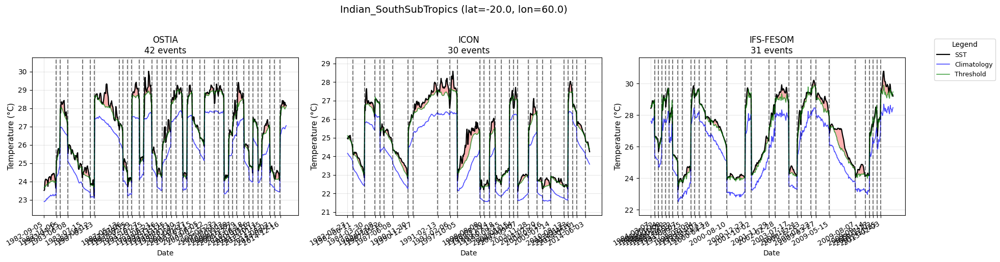


POINT: Southern_Ocean (lat=-45, lon=-60)
Trimmed to 393 days around 23 MHW events

Displaying 393 days around 23 MHW events:
------------------------------------------------------------
Segment 1: 1989-08-10 to 1989-08-28 (19 days)
Segment 2: 1989-09-11 to 1989-09-23 (13 days)
Segment 3: 1989-12-03 to 1989-12-11 (9 days)
Segment 4: 1989-12-21 to 1989-12-31 (11 days)
Segment 5: 1990-02-23 to 1990-03-06 (12 days)
Segment 6: 1993-10-23 to 1993-10-31 (9 days)
Segment 7: 1998-05-31 to 1998-06-08 (9 days)
Segment 8: 1998-06-15 to 1998-09-14 (92 days)
Segment 9: 2000-03-11 to 2000-03-20 (10 days)
Segment 10: 2004-02-01 to 2004-02-16 (16 days)
Segment 11: 2004-02-29 to 2004-03-10 (11 days)
Segment 12: 2004-03-12 to 2004-05-15 (65 days)
Segment 13: 2004-06-20 to 2004-06-28 (9 days)
Segment 14: 2005-09-22 to 2005-09-30 (9 days)
Segment 15: 2006-05-31 to 2006-06-08 (9 days)
Segment 16: 2011-11-01 to 2011-11-26 (26 days)
Segment 17: 2011-12-09 to 2012-01-05 (28 days)
Segment 18: 2012-01-17 to 201

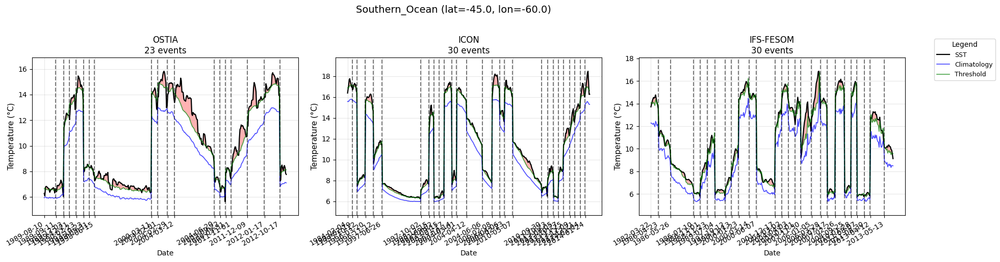


POINT: Mediterranean_Sea (lat=35, lon=15)
Trimmed to 518 days around 32 MHW events

Displaying 518 days around 32 MHW events:
------------------------------------------------------------
Segment 1: 1985-04-04 to 1985-04-13 (10 days)
Segment 2: 1985-06-06 to 1985-06-14 (9 days)
Segment 3: 1986-09-12 to 1986-09-23 (12 days)
Segment 4: 1987-09-22 to 1987-10-01 (10 days)
Segment 5: 1989-12-11 to 1990-01-26 (47 days)
Segment 6: 1990-02-03 to 1990-02-18 (16 days)
Segment 7: 1990-02-21 to 1990-04-09 (48 days)
Segment 8: 1990-10-07 to 1990-10-16 (10 days)
Segment 9: 1990-10-28 to 1990-11-14 (18 days)
Segment 10: 1990-11-23 to 1990-12-01 (9 days)
Segment 11: 1993-11-27 to 1993-12-27 (31 days)
Segment 12: 1994-08-05 to 1994-08-19 (15 days)
Segment 13: 1994-09-09 to 1994-09-17 (9 days)
Segment 14: 1994-12-08 to 1994-12-17 (10 days)
Segment 15: 1995-08-02 to 1995-08-10 (9 days)
Segment 16: 1999-05-11 to 1999-05-19 (9 days)
Segment 17: 1999-08-25 to 1999-09-02 (9 days)
Segment 18: 1999-09-08 to 19

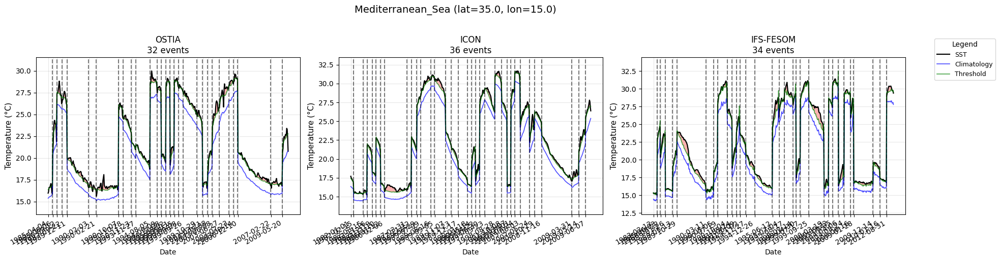


SUMMARY OF MHW EVENTS
Point                Lat    Lon                 OSTIA                           ICON                        IFS-FESOM            
                                 Events   AvgDur MaxDur TempMin  TempMax  Events   AvgDur MaxDur TempMin  TempMax  Events   AvgDur MaxDur TempMin  TempMax  
--------------------------------------------------------------------------------
Western_EQ_Pacific_1 0.0    160.0   34       8.6    45     28.5     32.3     32       10.7   35     24.2     27.8     36       12.1   83     27.7     32.1     
Western_EQ_Pacific_2 5.0    170.0   33       8.6    37     28.0     31.8     35       9.6    29     25.1     29.1     30       12.9   39     27.5     32.0     
Western_EQ_Pacific_3 -5.0   150.0   45       9.1    28     28.3     32.8     22       10.3   28     28.2     30.5     32       12.8   31     28.3     32.6     
Eastern_EQ_Pacific_1 0.0    -110.0  20       30.6   244    21.3     31.4     38       8.9    36     17.6     28.8     53       8.

In [20]:


# ============================================
# STEP 3: Plot comparisons for all points
# ============================================

# Option A: Plot all points and show them
summaries = plot_all_points_model_comparisons(
    points_of_interest,
    model_data_mapping,
    buffer_days=2,        # Show 5 days before/after each event
    time_slice=None,      # You can specify a time slice if needed
    save_dir=None         # Optional: directory to save figures
)


In [ ]:
## BASIN AVERAGES FOR WESTERN AND EASTERN EQUATORIAL PACIFIC

In [23]:


# First, compute regional averages for Eastern and Western Equatorial Pacific
region_averages = {}

for model_name, model_data in model_data_mapping.items():
    region_averages[model_name] = {}
    
    # Get the mask for this model (assuming you have masks_dict from earlier)
    if model_name in masks_dict:
        for region in ['Eastern_Equatorial_Pacific', 'Western_Equatorial_Pacific']:
            if region in masks_dict[model_name]:
                mask = masks_dict[model_name][region]
                
                # Compute average event count in this region
                if 'mhw_events' in model_data:
                    mhw_ds = model_data['mhw_events']
                    masked_events = mhw_ds.event_count.where(mask)
                    avg_events = masked_events.mean().compute().values
                    
                    # Count total events in region
                    total_events = masked_events.sum().compute().values
                    
                    # Count number of grid cells in region
                    n_cells = mask.sum().compute().values
                    
                    # Compute average duration
                    masked_durations = mhw_ds.event_durations.where(mask)
                    avg_duration = masked_durations.where(masked_durations > 0).mean().compute().values
                    
                    region_averages[model_name][region] = {
                        'avg_events_per_cell': avg_events,
                        'total_events': total_events,
                        'avg_duration': avg_duration,
                        'n_cells': n_cells
                    }
                    
                    print(f"{model_name} - {region}:")
                    print(f"  Grid cells: {n_cells}")
                    print(f"  Total events: {total_events:.0f}")
                    print(f"  Avg events per cell: {avg_events:.2f}")
                    print(f"  Avg duration: {avg_duration:.1f} days")
                    print()

# Compare the two regions
print("="*50)
print("EASTERN vs WESTERN EQUATORIAL PACIFIC COMPARISON")
print("="*50)

for model_name in region_averages:
    if 'Eastern_Equatorial_Pacific' in region_averages[model_name] and 'Western_Equatorial_Pacific' in region_averages[model_name]:
        east = region_averages[model_name]['Eastern_Equatorial_Pacific']
        west = region_averages[model_name]['Western_Equatorial_Pacific']
        
        print(f"\n{model_name}:")
        print(f"  Events per cell: East={east['avg_events_per_cell']:.2f}, West={west['avg_events_per_cell']:.2f}")
        print(f"  Total events: East={east['total_events']:.0f}, West={west['total_events']:.0f}")
        print(f"  Avg duration: East={east['avg_duration']:.1f} days, West={west['avg_duration']:.1f} days")

/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.53 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.54 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.57 MiB.
This may cause some slowdown.
Cons

OSTIA - Eastern_Equatorial_Pacific:
  Grid cells: 22497
  Total events: 494460
  Avg events per cell: 21.98
  Avg duration: 23.2 days



/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.53 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.54 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.57 MiB.
This may cause some slowdown.
Cons

OSTIA - Western_Equatorial_Pacific:
  Grid cells: 30918
  Total events: 1134050
  Avg events per cell: 36.68
  Avg duration: 9.8 days



/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.60 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.61 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.66 MiB.
This may cause some slowdown.
Cons

ICON - Eastern_Equatorial_Pacific:
  Grid cells: 22723.0
  Total events: 770919
  Avg events per cell: 33.22
  Avg duration: 12.0 days



/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.60 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.61 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.66 MiB.
This may cause some slowdown.
Cons

ICON - Western_Equatorial_Pacific:
  Grid cells: 31270.0
  Total events: 1076192
  Avg events per cell: 33.89
  Avg duration: 10.8 days



/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.60 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.61 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.66 MiB.
This may cause some slowdown.
Cons

IFS-FESOM - Eastern_Equatorial_Pacific:
  Grid cells: 22719.0
  Total events: 822744
  Avg events per cell: 35.46
  Avg duration: 12.6 days



/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.60 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.61 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:3383: UserWarning: Sending large graph of size 11.66 MiB.
This may cause some slowdown.
Cons

IFS-FESOM - Western_Equatorial_Pacific:
  Grid cells: 31216.0
  Total events: 1162507
  Avg events per cell: 36.68
  Avg duration: 11.1 days

EASTERN vs WESTERN EQUATORIAL PACIFIC COMPARISON

OSTIA:
  Events per cell: East=21.98, West=36.68
  Total events: East=494460, West=1134050
  Avg duration: East=23.2 days, West=9.8 days

ICON:
  Events per cell: East=33.22, West=33.89
  Total events: East=770919, West=1076192
  Avg duration: East=12.0 days, West=10.8 days

IFS-FESOM:
  Events per cell: East=35.46, West=36.68
  Total events: East=822744, West=1162507
  Avg duration: East=12.6 days, West=11.1 days


PLOTTING ALL POINTS WITH MODEL COMPARISONS

POINT: Eastern_EQ_Pacific_AVG (lat=0, lon=-110)
Trimmed to 1065 days around 20 MHW events

Displaying 1065 days around 20 MHW events:
------------------------------------------------------------
Segment 1: 1982-09-19 to 1983-03-18 (181 days)
Segment 2: 1983-03-21 to 1983-07-13 (115 days)
Segment 3: 1987-06-22 to 1987-07-26 (35 days)
Segment 4: 1987-08-19 to 1987-09-25 (38 days)
Segment 5: 1992-04-23 to 1992-05-27 (35 days)
Segment 6: 1994-10-01 to 1994-11-04 (35 days)
Segment 7: 1997-05-22 to 1998-05-27 (371 days)
Segment 8: 2006-11-17 to 2006-12-24 (38 days)
Segment 9: 2009-08-07 to 2009-09-11 (36 days)
Segment 10: 2009-12-04 to 2010-01-10 (38 days)
Segment 11: 2012-07-11 to 2012-08-17 (38 days)
Segment 12: 2014-05-31 to 2014-07-05 (36 days)
Segment 13: 2014-08-15 to 2014-09-18 (35 days)
Segment 14: 2014-11-27 to 2014-12-30 (34 days)

MHW Events in plot:
✓ Event 1: 1982-10-04 to 1982-10-13 (10 days)
✓ Event 2: 1982-10-20 to 1983-02-18 (122 d

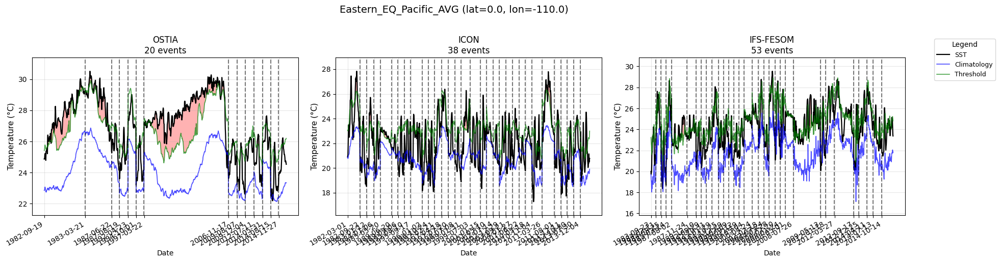


POINT: Western_EQ_Pacific_AVG (lat=0, lon=160)
Trimmed to 1184 days around 34 MHW events

Displaying 1184 days around 34 MHW events:
------------------------------------------------------------
Segment 1: 1983-07-05 to 1983-08-15 (42 days)
Segment 2: 1985-08-06 to 1985-09-22 (48 days)
Segment 3: 1986-02-09 to 1986-03-15 (35 days)
Segment 4: 1989-12-19 to 1990-01-22 (35 days)
Segment 5: 1990-02-13 to 1990-04-17 (64 days)
Segment 6: 1990-05-14 to 1990-06-28 (46 days)
Segment 7: 1990-07-01 to 1990-08-05 (36 days)
Segment 8: 1990-09-13 to 1990-11-25 (74 days)
Segment 9: 1991-02-20 to 1991-05-03 (73 days)
Segment 10: 1991-05-29 to 1991-07-02 (35 days)
Segment 11: 1994-11-10 to 1994-12-17 (38 days)
Segment 12: 1995-01-19 to 1995-02-23 (36 days)
Segment 13: 1995-03-04 to 1995-04-07 (35 days)
Segment 14: 1995-04-29 to 1995-06-03 (36 days)
Segment 15: 1995-11-26 to 1996-03-09 (105 days)
Segment 16: 2003-07-31 to 2003-09-05 (37 days)
Segment 17: 2005-02-23 to 2005-03-30 (36 days)
Segment 18: 20

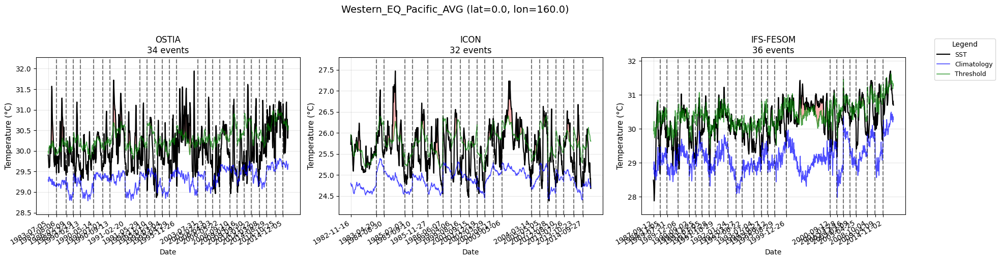


SUMMARY OF MHW EVENTS
Point                Lat    Lon                 OSTIA                           ICON                        IFS-FESOM            
                                 Events   AvgDur MaxDur TempMin  TempMax  Events   AvgDur MaxDur TempMin  TempMax  Events   AvgDur MaxDur TempMin  TempMax  
--------------------------------------------------------------------------------
Eastern_EQ_Pacific_AVG 0.0    -110.0  20       30.6   244    21.2     31.4     38       8.9    36     16.2     28.9     53       8.8    30     15.8     30.8     
Western_EQ_Pacific_AVG 0.0    160.0   34       8.6    45     28.5     32.3     32       10.7   35     24.1     27.8     36       12.1   83     27.5     32.1     
--------------------------------------------------------------------------------

TOTALS:
  OSTIA: 54 total events across all points
  ICON: 70 total events across all points
  IFS-FESOM: 89 total events across all points


In [24]:
# Create points representing the regional averages
regional_points = [
    {"name": "Eastern_EQ_Pacific_AVG", "lat": 0, "lon": -110},
    {"name": "Western_EQ_Pacific_AVG", "lat": 0, "lon": 160},
]

# Run the comparison for these representative points
all_summaries = plot_all_points_model_comparisons(
    regional_points,
    model_data_mapping,
    buffer_days=15
)

# AREA of MHW events

In [8]:
o_exx=o_ex.chunk(chunks={'time': 50, 'lat': -1, 'lon': -1}).isel(time=slice(365,1048))
o_exx

<xarray.DataArray 'extreme_events' (time: 683, lat: 480, lon: 1440)> Size: 472MB
dask.array<getitem, shape=(683, 480, 1440), dtype=bool, chunksize=(50, 480, 1440), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 5kB 1983-01-01T12:00:00 ... 1984-11-13T12:...
  * lat      (lat) float32 2kB -49.88 -49.62 -49.38 -49.12 ... 69.38 69.62 69.88
  * lon      (lon) float32 6kB -179.9 -179.6 -179.4 -179.1 ... 179.4 179.6 179.9

In [10]:
%%time
from dask import persist
from dask_image.ndmeasure import label
extreme_events_ds=o_exx
data_bin=o_exx
neighbours = np.zeros((3, 3, 3))


neighbours[1, :, :] = 1  # All 8 neighbours, but ignore time


object_id_field, N_objects = label(
    data_bin,
    structure=neighbours,
    wrap_axes=(2,),  # Wrap in x-direction !
)

results = persist(object_id_field, N_objects)
object_id_field, N_objects = results

N_objects = N_objects.compute()

# Convert to DataArray with same coordinates as input
object_id_field = (
    xr.DataArray(
        object_id_field,
        coords=data_bin.coords,
        dims=data_bin.dims,
        attrs=data_bin.attrs,
    )
    .rename("ID_field")
    .astype(np.int32)
)



CPU times: user 17.8 s, sys: 6.65 s, total: 24.5 s
Wall time: 1min 36s


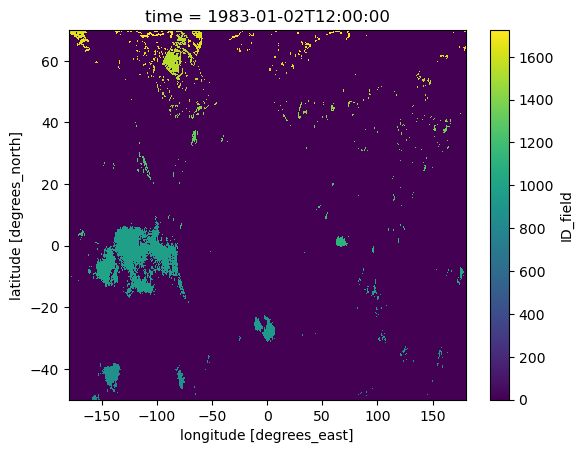

In [15]:
object_id_field.isel(time=1).plot()

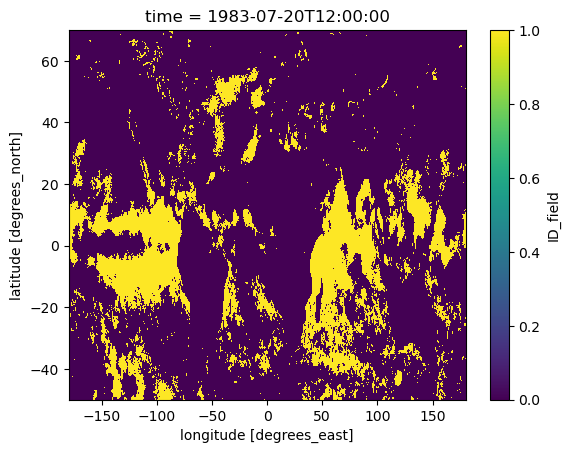

In [14]:
(object_id_field>1).isel(time=200).plot()

In [43]:

#Proper area thing using object_id_field:



# Calculate grid areas
R_earth = 6371.0  # km
resolution = 0.25  # deg

lat_r, lon_r, dlat, dlon = (
    np.radians(extreme_events_ds.lat),
    np.radians(extreme_events_ds.lon),
    np.radians(resolution),
    np.radians(resolution),
)
grid_area = (R_earth**2 * np.abs(np.sin(lat_r + dlat / 2) - np.sin(lat_r - dlat / 2)) * dlon).astype(np.float32)
     

def compute_areas_by_id(id_field, grid_area):
    """Compute area for each ID using efficient indexing"""
    # Broadcast grid_area to match id_field shape
    grid_broadcast = np.broadcast_to(grid_area[:, np.newaxis], id_field.shape)
    areas = np.zeros(len(unique_ids), dtype=np.float32)

    # Vectorised accumulation
    flat_ids = id_field.ravel()
    flat_grid = grid_broadcast.ravel()

    for idx, id_val in range(N_objects):
        areas[idx] = flat_grid[flat_ids == id_val].sum()

    return areas


areas = xr.apply_ufunc(
    compute_areas_by_id,
    object_id_field,
    grid_area,
    input_core_dims=[["lat", "lon"], ["lat"]],
    output_core_dims=[["ID"]],
    dask="parallelized",
    vectorize=True,
    output_dtypes=[np.float32],
)

areas = areas.compute()


dask.array<getitem, shape=(183, 480, 1440), dtype=int32, chunksize=(50, 480, 1440), chunktype=numpy.ndarray>